## (FIRST ATTEMPT) Convert the csv file into xml format with the right setup for transcript to format tfrecord file

All the datasets are labeled in .csv files with corresponding filenames, but for this data training excersize, i need to convert the labeling files into .xml format in order to let the FTRecord to set training

In [ ]:
import os
import pandas as pd
import xml.etree.ElementTree as ET
from xml.dom import minidom

def prettify(elem):
    rough_string = ET.tostring(elem, 'utf-8')
    reparsed = minidom.parseString(rough_string)
    return '\n'.join([line for line in reparsed.toprettyxml(indent="\t").split('\n') if line.strip() and not line.startswith('<?xml')])

def csv_to_xml(directory):
    csv_files = [file for file in os.listdir(directory) if file.endswith('.csv')]
    
    for file in csv_files:
        df = pd.read_csv(os.path.join(directory, file))
        
        for filename in df['filename'].unique():
            root = ET.Element('annotation')
            ET.SubElement(root, 'folder').text = 'images'
            ET.SubElement(root, 'filename').text = filename
            ET.SubElement(root, 'path').text = os.path.join(directory, filename)
            source = ET.SubElement(root, 'source')
            ET.SubElement(source, 'database').text = 'Unknown'
            size = ET.SubElement(root, 'size')
            ET.SubElement(size, 'width').text = str(df.loc[df['filename'] == filename, 'width'].values[0])
            ET.SubElement(size, 'height').text = str(df.loc[df['filename'] == filename, 'height'].values[0])
            ET.SubElement(size, 'depth').text = '3'
            ET.SubElement(root, 'segmented').text = '0'
            
            for index, row in df[df['filename'] == filename].iterrows():
                obj = ET.SubElement(root, 'object')
                ET.SubElement(obj, 'name').text = row['class']
                ET.SubElement(obj, 'pose').text = 'Unspecified'
                ET.SubElement(obj, 'truncated').text = '0'
                ET.SubElement(obj, 'difficult').text = '0'
                bndbox = ET.SubElement(obj, 'bndbox')
                ET.SubElement(bndbox, 'xmin').text = str(int(round(row['xmin'])))
                ET.SubElement(bndbox, 'ymin').text = str(int(round(row['ymin'])))
                ET.SubElement(bndbox, 'xmax').text = str(int(round(row['xmax'])))
                ET.SubElement(bndbox, 'ymax').text = str(int(round(row['ymax'])))
            
            with open(os.path.join(directory, filename.split('.')[0] + '.xml'), 'w', encoding='utf-8') as f:
                f.write(prettify(root))

csv_to_xml('/Users/peter/Desktop/images/')


## So the xml files seems to miss the extension .JPG for both <filename> and <path> ... + filename, so the code is corrected as follow

In [ ]:
import os
import xml.etree.ElementTree as ET
from xml.dom import minidom

def prettify(elem):
    rough_string = ET.tostring(elem, 'utf-8')
    reparsed = minidom.parseString(rough_string)
    return '\n'.join([line for line in reparsed.toprettyxml(indent="\t").split('\n') if line.strip() and not line.startswith('<?xml')])

def add_extension(directory):
    xml_files = [file for file in os.listdir(directory) if file.endswith('.xml')]
    
    for file in xml_files:
        # Parse the XML file and get the root element
        tree = ET.parse(os.path.join(directory, file))
        root = tree.getroot()

        # Find the filename and path elements and add the extension to their text
        filename = root.find('filename')
        path = root.find('path')

        if filename is not None and path is not None:
            filename.text += '.jpg'
            path.text += '.jpg'

        # Write the modified XML back to the file
        with open(os.path.join(directory, file), 'w', encoding='utf-8') as f:
            f.write(prettify(root))

add_extension('/Users/peter/Desktop/images/')


## Lets show the number of samples based on the 'classes' in the dataset

In order to count the number of different class types in XML files and visualize this data with a bar graph, you can use Python's xml.etree.ElementTree for parsing XML and matplotlib for creating the bar graph.

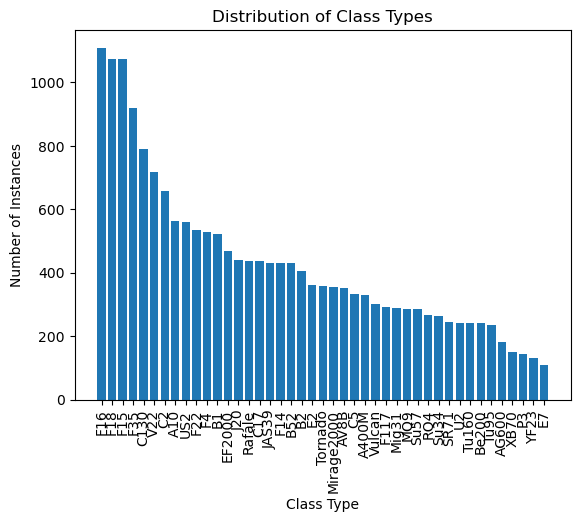

In [8]:
import os
import xml.etree.ElementTree as ET
from collections import Counter
import matplotlib.pyplot as plt

# Specify the directory where the XML files are located
directory = '/Users/peter/Desktop/images'

# Counter to store class frequencies
class_counter = Counter()

# Loop over each XML file in the directory
for filename in os.listdir(directory):
    if filename.endswith('.xml'):
        # Parse the XML file
        tree = ET.parse(os.path.join(directory, filename))
        root = tree.getroot()

        # Find all 'object' tags and for each 'object', find the 'name' tag
        for obj in root.findall('object'):
            class_name = obj.find('name').text
            class_counter[class_name] += 1

# Sort classes from most to least
sorted_classes = sorted(class_counter.items(), key=lambda item: item[1], reverse=True)

# Plot the bar graph
labels, values = zip(*sorted_classes)
plt.bar(labels, values)
plt.xlabel('Class Type')
plt.ylabel('Number of Instances')
plt.title('Distribution of Class Types')
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.show()


## Dataset downsizing for efficient trainning time

Seems like some `classes` of datsets has way more than the other. To streamline the trainning time, i do the follwoing:
    

    * Randomly shortening the `classes` that are exceeding over 600 qty
    * Resave it into different directory

In [15]:
import os
import xml.etree.ElementTree as ET
import shutil

src_directory = '/Users/peter/Desktop/images'
dest_directory = '/Users/peter/Desktop/imagesShortlist'

# List of classes to filter out
filter_classes = ['F16', 'F18', 'F35', 'F15', 'C130', 'V22', 'C2']

# Create the destination directory if it doesn't exist
os.makedirs(dest_directory, exist_ok=True)

# Iterate over all XML files in the source directory
for filename in os.listdir(src_directory):
    if filename.endswith('.xml'):
        tree = ET.parse(os.path.join(src_directory, filename))
        root = tree.getroot()

        # List to store classes in the current file
        current_classes = []

        for obj in root.findall('object'):
            class_name = obj.find('name').text
            current_classes.append(class_name)
        
        # Check if the current file exclusively contains the filter classes
        if not any(class_name not in filter_classes for class_name in current_classes):
            continue

        # If not, copy the image and XML file to the destination directory
        image_filename = filename.replace('.xml', '.jpg')
        
        shutil.copyfile(os.path.join(src_directory, filename), 
                        os.path.join(dest_directory, filename))
        shutil.copyfile(os.path.join(src_directory, image_filename), 
                        os.path.join(dest_directory, image_filename))


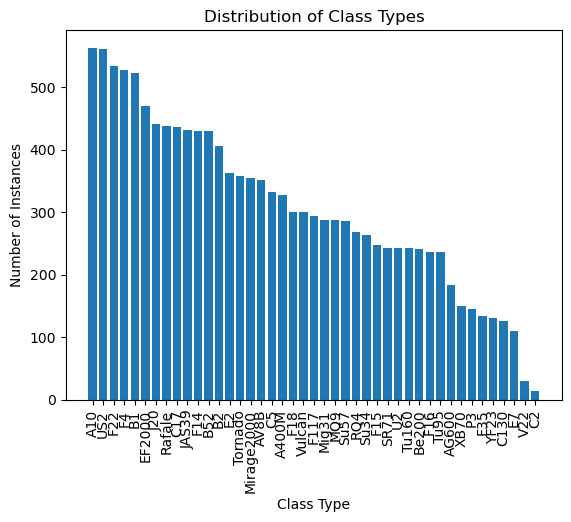

In [16]:
# Specify the directory where the XML files are located
directory = '/Users/peter/Desktop/imagesShortlist'

# Counter to store class frequencies
class_counter = Counter()

# Loop over each XML file in the directory
for filename in os.listdir(directory):
    if filename.endswith('.xml'):
        # Parse the XML file
        tree = ET.parse(os.path.join(directory, filename))
        root = tree.getroot()

        # Find all 'object' tags and for each 'object', find the 'name' tag
        for obj in root.findall('object'):
            class_name = obj.find('name').text
            class_counter[class_name] += 1

# Sort classes from most to least
sorted_classes = sorted(class_counter.items(), key=lambda item: item[1], reverse=True)

# Plot the bar graph
labels, values = zip(*sorted_classes)
plt.bar(labels, values)
plt.xlabel('Class Type')
plt.ylabel('Number of Instances')
plt.title('Distribution of Class Types')
plt.xticks(rotation=90)  # Rotate x-axis labels
plt.show()

In [13]:
# Specify the directory where the XML files are located
src_directory = '/Users/peter/Desktop/imagesShortlist'

# Counter to store class frequencies
class_counter = Counter()

# Loop over each XML file in the directory
for filename in os.listdir(src_directory):
    if filename.endswith('.xml'):
        # Parse the XML file
        tree = ET.parse(os.path.join(src_directory, filename))
        root = tree.getroot()

        # Find all 'object' tags and for each 'object', find the 'name' tag
        for obj in root.findall('object'):
            class_name = obj.find('name').text
            class_counter[class_name] += 1

print(f"Count for class 'E7': {class_counter['E7']}")
print(f"Count for class 'YF23': {class_counter['YF23']}")


Count for class 'E7': 51
Count for class 'YF23': 50


In [14]:
# Specify the directory where the XML files are located
src_directory = '/Users/peter/Desktop/imagesXML'

# Counter to store class frequencies
class_counter = Counter()

# Loop over each XML file in the directory
for filename in os.listdir(src_directory):
    if filename.endswith('.xml'):
        # Parse the XML file
        tree = ET.parse(os.path.join(src_directory, filename))
        root = tree.getroot()

        # Find all 'object' tags and for each 'object', find the 'name' tag
        for obj in root.findall('object'):
            class_name = obj.find('name').text
            class_counter[class_name] += 1

print(f"Count for class 'E7': {class_counter['E7']}")
print(f"Count for class 'YF23': {class_counter['YF23']}")

Count for class 'E7': 110
Count for class 'YF23': 130


### In conclusion, the samples data are still too unevenly distributed based on the total qty of each `class`

# Resize the image and make it trainable by machine

Resizing the images and edit the bounding boxes coordinate
First pick the longer side of all the images and proportionally change the size to 640 dpi. 
Put a white padding on the back to make it 640 x 640 square image and write over the orignal images

## Image resize + bbox coordinate change:
1. from this directory: "/Users/peter/Desktop/images/"
2. ok so if i want to resize the longer side of all my images into 640 dpi and still keeping the proportion in tacked without distortion.
3. also change the <bbox> coordinate based on each resized images

## Adding the white padding and edit the bounding boxes based on the padding
1. After the image has been resized, need to put white padding behind all the resized image to make new images into 640,640
2. Edit the bounding boxes coordinate with padding added image based on each of the image's original spec

#### Lets run some tests

In [49]:
import cv2
import os

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# We'll only take the first 5 image files
image_files = [file for file in files if file.endswith('.jpg')][:5]

# Iterate over each image file
for image_file in image_files:
    # Read the image
    img = cv2.imread(os.path.join(directory, image_file))
    h, w = img.shape[:2]

    # Calculate the resize ratio
    if h > w:
        new_h = 640
        new_w = int(w * (640 / h))
    else:
        new_w = 640
        new_h = int(h * (640 / w))

    # Resize the image while maintaining aspect ratio
    resized_img = cv2.resize(img, (new_w, new_h))

    # Save the resized image
    cv2.imwrite(os.path.join(directory, image_file), resized_img)

    print(f"Resized {image_file} to {new_w}x{new_h} pixels.")

print("Resizing complete.")


Resized 4ae057a58917ed6cedccec8c50d8ed65.jpg to 640x430 pixels.
Resized d9f6504a23abe5289e6b247cd10e8b07.jpg to 640x360 pixels.
Resized c56b565c6ec3fff0d9ce9527f472a8bb.jpg to 640x425 pixels.
Resized 8e4305d6715584160d4c0f8676c167db.jpg to 640x320 pixels.
Resized b0266e3e14fdc2621efb0c131d852ddb.jpg to 640x426 pixels.
Resizing complete.


In [58]:
import os
import xml.etree.ElementTree as ET
import math

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# We'll only take the first 5 image files
image_files = [file for file in files if file.endswith('.jpg')][:2]

# Iterate over each image file
for image_file in image_files:
    # Read the xml file
    xml_file = image_file.replace('.jpg', '.xml')
    tree = ET.parse(os.path.join(directory, xml_file))
    root = tree.getroot()

    # Get the original image dimensions
    size_elem = root.find('size')
    orig_width = int(size_elem.find('width').text)
    orig_height = int(size_elem.find('height').text)

    # Determine the longer side and calculate the resize ratio
    if orig_width > orig_height:
        longer_side = orig_width
    else:
        longer_side = orig_height
    resize_ratio = 640 / longer_side

    # Update the image dimensions
    size_elem.find('width').text = str(640)
    size_elem.find('height').text = str(640)

    # Update the bounding box coordinates
    for obj_elem in root.findall('object'):
        bbox_elem = obj_elem.find('bndbox')
        xmin = int(bbox_elem.find('xmin').text)
        ymin = int(bbox_elem.find('ymin').text)
        xmax = int(bbox_elem.find('xmax').text)
        ymax = int(bbox_elem.find('ymax').text)

        # Resize and round off the bounding box coordinates
        xmin = math.floor(xmin * resize_ratio)
        ymin = math.floor(ymin * resize_ratio)
        xmax = math.floor(xmax * resize_ratio)
        ymax = math.floor(ymax * resize_ratio)

        # Update the XML with the resized bounding box coordinates
        bbox_elem.find('xmin').text = str(xmin)
        bbox_elem.find('ymin').text = str(ymin)
        bbox_elem.find('xmax').text = str(xmax)
        bbox_elem.find('ymax').text = str(ymax)

    # Save the modified XML file
    tree.write(os.path.join(directory, xml_file))

    print(f"Modified {xml_file}.")

print("All XML files have been updated with resized dimensions and bounding box coordinates.")


Modified 4ae057a58917ed6cedccec8c50d8ed65.xml.
Modified d9f6504a23abe5289e6b247cd10e8b07.xml.
All XML files have been updated with resized dimensions and bounding box coordinates.


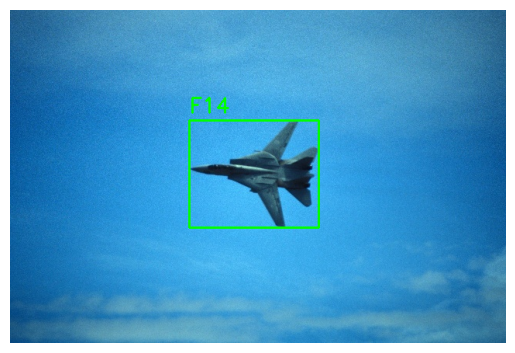

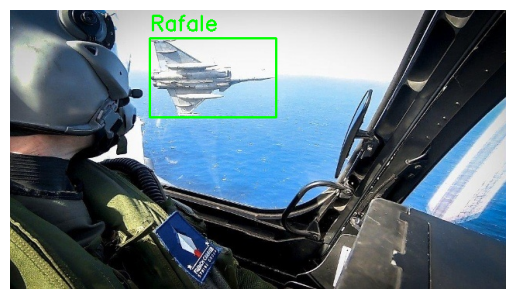

In [60]:
import cv2
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# We'll only take the first 5 image files
image_files = [file for file in files if file.endswith('.jpg')][:2]

# Iterate over each image file
for image_file in image_files:
    # Read the image
    img = cv2.imread(os.path.join(directory, image_file))
    h, w = img.shape[:2]

    # Resize the image
    if h > w:
        new_h, new_w = 640, int(640 * w / h)
    else:
        new_w, new_h = 640, int(640 * h / w)
    
    img_resized = cv2.resize(img, (new_w, new_h))

    # Read the xml file
    xml_file = image_file.replace('.jpg', '.xml')
    tree = ET.parse(os.path.join(directory, xml_file))
    root = tree.getroot()

    # Iterate over each object
    for obj in root.iter('object'):
        # Get the bounding box coordinates
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text) * new_w // w
        ymin = int(bbox.find('ymin').text) * new_h // h
        xmax = int(bbox.find('xmax').text) * new_w // w
        ymax = int(bbox.find('ymax').text) * new_h // h

        # Get the class name
        class_name = obj.find('name').text

        # Update the bounding box coordinates
        bbox.find('xmin').text = str(xmin)
        bbox.find('ymin').text = str(ymin)
        bbox.find('xmax').text = str(xmax)
        bbox.find('ymax').text = str(ymax)

        # Draw the bounding box on the image
        cv2.rectangle(img_resized, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(img_resized, class_name, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Plot the new image with bounding boxes for preview
    plt.figure()
    plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


### Image resize 
After testing the 2 images, lets execute the image resize for the entire directory

In [62]:
import os
import cv2
import math

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# Iterate over each image file
for image_file in files:
    if image_file.endswith('.jpg'):
        # Read the image
        img = cv2.imread(os.path.join(directory, image_file))
        h, w = img.shape[:2]

        # Determine the longer side and calculate the resize ratio
        if w > h:
            longer_side = w
            new_w, new_h = 640, int(640 * h / w)
        else:
            longer_side = h
            new_w, new_h = int(640 * w / h), 640
        
        # Resize the image
        img_resized = cv2.resize(img, (new_w, new_h))

        # Save the resized image with the original name
        cv2.imwrite(os.path.join(directory, image_file), img_resized)

        print(f"Resized {image_file}.")

print("All images have been resized to have a longer side of 640 pixels while maintaining the aspect ratio.")


Resized 4ae057a58917ed6cedccec8c50d8ed65.jpg.
Resized d9f6504a23abe5289e6b247cd10e8b07.jpg.
Resized c56b565c6ec3fff0d9ce9527f472a8bb.jpg.
Resized 8e4305d6715584160d4c0f8676c167db.jpg.
Resized b0266e3e14fdc2621efb0c131d852ddb.jpg.
Resized f96fca205ec42c0e715acdddff8664a4.jpg.
Resized 4c9e1d2aa40b4652de060073be20b849.jpg.
Resized 26bfdd2b7949f2c286e8f753ecc65e91.jpg.
Resized befa308cfe702336fc931ec9f384c330.jpg.
Resized 52f44b93355ee1908a1ac6160fb77e9f.jpg.
Resized a8a02c8b29ba3add68202ee4f66e2ca1.jpg.
Resized 1624eca3a678e90084c83ff10f516045.jpg.
Resized f6ae241c65a79a127f76a7b2da14d6ab.jpg.
Resized b2d02cf5b603e5e044f0aad935b4a42d.jpg.
Resized d1b40060c98839be71fa4a85a7e20632.jpg.
Resized 6656ab4b3af2be8277768e2396877b39.jpg.
Resized 0c2793dceb62c4f7da932bd90071a1b9.jpg.
Resized d7c0e3bf4acad7703539d7041c6dedba.jpg.
Resized 71dda1632ba77e7f4727444040ed8e63.jpg.
Resized b468cf3161d72099b021b35c3b079000.jpg.
Resized 7018a91d29d751c8dd0435216b722798.jpg.
Resized 3e1a185c4a17d2cd71e3aae598

Resized 392c000b348b5144256e697495714a1d.jpg.
Resized 4f8856efdac4e5daacde79ded38d300b.jpg.
Resized eacdb868157574909bcddb63c3f22997.jpg.
Resized 40bd574062ec6cf84daffd411c579cac.jpg.
Resized 35514d0cce2b8491d28b94675cf1fe52.jpg.
Resized 75a4a454497627ea7d7f720a37317f7a.jpg.
Resized 245a7ac14664f42cf1609ef5d272de15.jpg.
Resized 2f89422d9d169b63486adf18d484da4d.jpg.
Resized 3cb6d7382b8772b70b99fe86facab360.jpg.
Resized a0fe54683b6acf9e97d7035b1504c672.jpg.
Resized adddd6983e93ccb6e7bc26085e9fc8a6.jpg.
Resized 73813b9553e7ec4c14d9b2208e080d04.jpg.
Resized 3b8c80b6307a276314be38d52af5a834.jpg.
Resized c82a760a1af0cdf8fe0d57295ac5ed4d.jpg.
Resized e5541f7acc3513aa5ac2b526bd7f0c18.jpg.
Resized 5beea0bd40fe218b510200d10b76d6c5.jpg.
Resized 17e19410f3d0fef4f11bd5667401fe97.jpg.
Resized 5b854bd0200d81a3bc03ec8cb8b14ef9.jpg.
Resized ef29708d53bb6806a987f7ea47b82840.jpg.
Resized 44c12d50deddcb9269e3afb9919600b2.jpg.
Resized 206ac6a698959425569c9703ec625ee5.jpg.
Resized 2e6922284721f30ffa2dbf70d3

Resized 4521a5ed215bdeaf980220b24879cebd.jpg.
Resized 14a6adf4a51377c0e1adb7adc845d5ee.jpg.
Resized 50615796b1fb0c3d14563bd7718df84b.jpg.
Resized a9c3f718560dad65fd255cdced4d3b97.jpg.
Resized 6bd3934ab1c228c3079fe8a9113d53c3.jpg.
Resized 5d5adb44204f61dcc95ef649f5a0c46a.jpg.
Resized 2ced6429fd109ec4df5761ce54edfb25.jpg.
Resized 8144f37ed5ee0839476ddaa4bd8540da.jpg.
Resized 5d639b09d2526b6eb2bbf07f344f293d.jpg.
Resized e67020d630314a4106d07b8bafeef033.jpg.
Resized e98307956fcfd8999bf30ac94939a373.jpg.
Resized a5b0745a2267ee8570cf2f4b06296ee3.jpg.
Resized a8f0f07811b9c6e80176ac857ef9adf0.jpg.
Resized 0bae39b33c85206f1470a0533f2af31a.jpg.
Resized 436bad914ca1e1efee474b9fc3846dc9.jpg.
Resized e6fb2138faf47a8a625984c5dc8ef6d8.jpg.
Resized d041359c2edddd0ad9a88aa6f94d4a57.jpg.
Resized 692c6e71aec690b2032fa5a1203e370b.jpg.
Resized f26ad6db8f6ff64488277e4e13c7b108.jpg.
Resized b528de0e955da0e83ebdd862262097c5.jpg.
Resized 4480bfbcd144b09f37f83a6561cc965c.jpg.
Resized 638f8067388933ed56d4ef4639

Premature end of JPEG file


Resized 11beb14fd370efe506978ce331b77c42.jpg.
Resized fdd5dd4a6c853f28997ccb8e63d4ca65.jpg.
Resized 02f9db60647368db7a7651d2b24531ed.jpg.
Resized ba8fc6e5d46902d6bdc194d594055fdf.jpg.
Resized b3b9ee4367eec2904a7498ec2d78a087.jpg.
Resized 289cd1f061f99b4fb7d20d03d088f93e.jpg.
Resized 19a922eaed621cd734a87666d51296c4.jpg.
Resized 82841a5d1da5e256d53a220796d58d09.jpg.
Resized 0de4324225fe64cb236feca017916367.jpg.
Resized 40afb6d6f41d79af92560a1909eed26d.jpg.
Resized efd6a431583a6b1d5b30bb1d1418b7fc.jpg.
Resized 9f7d519fa88aafc1ec47e100d17dc01c.jpg.
Resized cc49a0fe2e67860053e157ba98692f18.jpg.
Resized c8586ee0b3ae19fbafe5e23e50d60022.jpg.
Resized 70a4ab70cc5a2a8c78c6052146012798.jpg.
Resized 1166a22ac93f9ba7bde3347b9cac3bb8.jpg.
Resized 3cb7e6c902ccf5977ac1f58d64787c7a.jpg.
Resized c6516ba5caa23f54b05bd37a666584d1.jpg.
Resized 88dffe8d4b07aafa14eb8bcd101b391d.jpg.
Resized 64b40ec4d8f1f1a41aa7ed4835e0f25d.jpg.
Resized 5ad31a935e1d0cf73bce39e22d10f709.jpg.
Resized f028462528471182dc7a3772dd

Resized a644758bba38d3b2208ef86305f77167.jpg.
Resized cf685d43cb7f76f1316dc782d63774ad.jpg.
Resized 67f2f0c0af81fc78da2e54acb7a9ae02.jpg.
Resized 1861e89f456a76ae2f20a3b512f97dcc.jpg.
Resized eeff2bf137046bf778d447e5f3b2dd2c.jpg.
Resized d749f4aeaf382cbd908418b538cea1b7.jpg.
Resized 4c51caebbc6d6a9d74511863161d37aa.jpg.
Resized 9dd3f58b37551d30e0e1e52f7e831332.jpg.
Resized 58a1e609c3ed2ab815a19a10a2b60af5.jpg.
Resized 3e7057033dc2c1d568c903933c31b9ae.jpg.
Resized 1476dc2d38fbf657963a4c04d0ddea7d.jpg.
Resized 0a4de7586aef9c15157cbc7698ac3cac.jpg.
Resized 0880fbe35cc488df9e8a1d3e92df95f9.jpg.
Resized 1c9caa2ec5e59d725ce174b366fdd838.jpg.
Resized e27a87a66150a4c0ab2a9ef5675dda5d.jpg.
Resized 34a0c8b3e1dc62dffb9c80670e8bee4d.jpg.
Resized ff5c3b88564a3961bd8b77d0aacf6999.jpg.
Resized 764a4a7a10f0e0f5a795ee6f3fafbc15.jpg.
Resized 5a5f04909840936757fde2b4979ee0ae.jpg.
Resized a621aebeff4df6d677b99b2725381fc8.jpg.
Resized 822d436c0c9f857b11ed15f9fe022a2e.jpg.
Resized a1c4ea85d244d37de1576c51f5

Resized aa5157f36943b6bfa0a6272140ccd4cf.jpg.
Resized 222c629d04dec45700d3cebcece65ee8.jpg.
Resized 81632a6d74f6def44cafda58991aa995.jpg.
Resized 7e4fbfec3f08c3546e71397d63dbe1a0.jpg.
Resized 26bdc45dae75b2baea110e51dc6e255c.jpg.
Resized 1dcad26309bbf2b30740f8809b6fe01f.jpg.
Resized 068accb6c55d222f930722a89949b52b.jpg.
Resized 7134bfb4c06103fcf0b8bffbae7c2797.jpg.
Resized 8d158dcf70364d69bf9fb7013383cc84.jpg.
Resized b410f26c3b6434283e01d848c3ceec37.jpg.
Resized 0a83b4094b3684aae9a3242da3f6c02d.jpg.
Resized 0978551bc6903340433012137d7d259a.jpg.
Resized e49dbe57532cb414f00b34217b4efca1.jpg.
Resized 92cd85a19d07b4a0be56a8113c956abb.jpg.
Resized 32bc78046f449cdbd1d30cefa09c2863.jpg.
Resized 68d1c7c6c63a461214dcd84486f1609c.jpg.
Resized 1e040f8b4ae6a30a7c611e311b52e034.jpg.
Resized baad6196baa3da48ba2b97db64a30b74.jpg.
Resized f6e891b393c20d89417d8c7ff1e0ec6c.jpg.
Resized fa3a5eb7358092ac42c6f73da6631a43.jpg.
Resized 16280a11ae392da7d3a88ba0bf849334.jpg.
Resized b491e0fc890419f1136de4977a

Resized b15a537b7007bea8fd2e32c402d0e3d7.jpg.
Resized 30969c3f9a35807509ba2f34c5158a32.jpg.
Resized d9a8259b6bee3d1941b26049c5204ad8.jpg.
Resized cebcdf38bc54e728b4cb2a82a32d69b4.jpg.
Resized 86fee91a08932519fe7ea4fc40f4d425.jpg.
Resized 0ea039b21d161c5cda85b8f9c7bea556.jpg.
Resized 7f81f34bf7c805e9d7a2f984371e3087.jpg.
Resized 6f7181d5c695f50e112247be258a306a.jpg.
Resized f54c8f955835f7832a90dd374c93a164.jpg.
Resized 70ed536e4b6d83758cd193c466483118.jpg.
Resized 067a97214e2dd6c1423bf1306e1baea6.jpg.
Resized c764a7be4cb3d79ac145cba2aae60460.jpg.
Resized 88e70c8e417016c22254f92c4c2159b2.jpg.
Resized 2e1ac710d9e294079b9b7a3d87697b52.jpg.
Resized 8f6a7c23c03aa08164fd23eef105c5da.jpg.
Resized 4000429a2e4e1d5690e41c002a4f3cc2.jpg.
Resized 0e0ab8aba42d045b2578e5475f079aa3.jpg.
Resized 4bf287fff49ad389f60b068175554c12.jpg.
Resized b43a0020d225613b5787d3363fba9091.jpg.
Resized 41ceb5c5e80d15b2285f6dcd25615d41.jpg.
Resized 4c422f5020d4fb8eaa9e35be9b4f295a.jpg.
Resized ea8360224d5f9843a3a9310f57

Resized b1fe9d02a8ab5c9604efd82eae4d83d2.jpg.
Resized 25e52168c61200dec82b2d5cabb3da95.jpg.
Resized f4b3b865f297951f0f8fc46bd4d16a9a.jpg.
Resized 11fb18bc1541272620efcadf3b7f9886.jpg.
Resized 147920e9d19da9b6efaad0b6a66f543a.jpg.
Resized 0d9c926842db11ebd6a572ea9249d531.jpg.
Resized ea6afef0ca81c20dd4064b91b2958a66.jpg.
Resized c407b877d6fbe926b3a8c109bf539540.jpg.
Resized 2d8dba32da13f521d49b4a86513a9f9d.jpg.
Resized b14d74b1099ae60347ec57c4259c1ed1.jpg.
Resized a521bff2ed02b0a673d6c03a59e77486.jpg.
Resized 8a9d99b08f31518fdff69290a7804439.jpg.
Resized 37d45e15ca680c29da13a804cd1c789b.jpg.
Resized bb884c61848111c5272b115d8d37d3b1.jpg.
Resized 1e8b43deca87d25180aba67557735c01.jpg.
Resized a2d3d69ac1aebc5ca34229884f14ac0b.jpg.
Resized c76f0b7ee0c371a02ce52e7a872c5634.jpg.
Resized 1905116b1b21fe4cdd084cc8c4953c63.jpg.
Resized 2ddc05960bed719fb0eefcad1e8f6a25.jpg.
Resized 123f3358cee17ced607b1f0c27d7d1a6.jpg.
Resized a702db25af399acfb87a3377901f2bdf.jpg.
Resized 93566b8e41a96e754556e9a8f3

Resized f5539543e37ef1d459897259ee2d30b5.jpg.
Resized b075ba6c9c54738a411847d085c501fd.jpg.
Resized b7f3cab1905f251c7c08fbf26b2ee24d.jpg.
Resized f9217e66438865ab1310d130226873b0.jpg.
Resized aeccfb9670dd3c3f98aba1a3cf135edf.jpg.
Resized 722a70523719c134cbb3956b89c2eb41.jpg.
Resized dbc007ba4ba361ae9d0d48b46925a3a3.jpg.
Resized b9f7a2553c6a3a6fede121177c98047a.jpg.
Resized a0d7a3303adf6912a20bfaffeb55657a.jpg.
Resized 5e226c5bce80ff2f01aead97f74d6a81.jpg.
Resized 052001ef703d438a786bcb0a8fadf88f.jpg.
Resized 02734fcb986f51711325d049ec55d14e.jpg.
Resized 2d72b9b083f18ff296ad36c2c5f71d3a.jpg.
Resized d2e2ebdeea9250fb6187b232193c1a40.jpg.
Resized 42468986e854d485eb8f969faa3bcc6d.jpg.
Resized 403eeae73c50c7122f3831a2ef946937.jpg.
Resized 8c07709344a5d6f23d72c1503895cf7d.jpg.
Resized 368d72b389bdcb2c6bcc6a71d7b5beb2.jpg.
Resized 40d7e8753a267782758e15cbd8430fce.jpg.
Resized 1c32e3094163151d9ce3f0f99554dfeb.jpg.
Resized ba9b6ea0fe8a36bb7a9a5c86a3280a1d.jpg.
Resized 4e1b868de0d95d7f799cf23242

Resized 00db76f676528477c66c93c7d24d7524.jpg.
Resized 0052ebf62f5f24c027a08b99ab00c9b9.jpg.
Resized c9dbd701fa22ff5f884b94e85c4dd350.jpg.
Resized afbfb4697fef466edb0c3d7ad5f9c4b5.jpg.
Resized 258ba112bf3f0fa82930336f88a35845.jpg.
Resized 12e2bcfebd1f68a7849e7206dbab28a7.jpg.
Resized 34beee4b3db047a9aecca638716d35f6.jpg.
Resized 7fd7a8a2fe4a5433108e45008fea45e8.jpg.
Resized 4fbccd015ab956f1ff88f14b21c9b6e5.jpg.
Resized 607edcf05c644c039a546f15cb684609.jpg.
Resized 40eb93fe06875caaba20930f7b20f0d4.jpg.
Resized c74adb81aebeacbbf21a9a773eab5246.jpg.
Resized 040cce6605507ce382c9bda7de810bb2.jpg.
Resized a9f97e83b8bc85859c3ae0fe23a91ade.jpg.
Resized 3fd7a82f417113171ef33134282a534b.jpg.
Resized 66634d55ab6e443438beec817bdec509.jpg.
Resized 75c0a750073deb9db823f502fd57423e.jpg.
Resized d6661b13519ef67710281950d089bb4a.jpg.
Resized bb6fec8b61ffb4c11d79bee7de18f3ab.jpg.
Resized fdb2a9cb0ef6703af190198dffcbd4ac.jpg.
Resized 6a93b41e7e3fa5a0d727eee08aeff553.jpg.
Resized 4b945b373e4045c346459d7d17

Resized 2b79a250cbd6dc7a5ff3d6c414ac641b.jpg.
Resized 7981322b7f30cb4029f813d3fea69a4c.jpg.
Resized 853af9acfd81739b89f530c5897ae787.jpg.
Resized 014313402292d8dbc688f9f1c50fa0ad.jpg.
Resized 0e2f466a4feb04bd594d6e6a2350c340.jpg.
Resized 3a6077c5a12f775d3e263d3ca0ffa896.jpg.
Resized fc7f247644687ce4d55f1991a555ca0a.jpg.
Resized 7665be06b8043c26c8b87962f441818b.jpg.
Resized 5c0192b2db81465c7665183cce0fde05.jpg.
Resized 5ebcc2319ec414da3266033d97bec31f.jpg.
Resized d195095cda53f0652905ed0f9fba7bff.jpg.
Resized 2224d2d1905d9f1721399cabe581112b.jpg.
Resized 6cda9c7f7259ed4e2a7cab4da2f4c99f.jpg.
Resized dcdff26624da7c59bdf3b7432c9a0957.jpg.
Resized 8d13af9fddccacd38ae228a90ae5dde4.jpg.
Resized c66da9a1e7e66a5dc9eb3b287fd3f635.jpg.
Resized b7cdd7a48359982b7bb52766f33b5477.jpg.
Resized edcea0a12b6194c840659cf94fb72e95.jpg.
Resized 1df82dc4da8bb21497161e580498ce8b.jpg.
Resized d43f0dc498092f2d09562aa943a91e2e.jpg.
Resized 0e5c0f6d779768a0380765a04b938f7a.jpg.
Resized 90a2b4564b51abbdcc83b586ec

Resized 7763b6ad4d95612a5d0f0c9419f0d376.jpg.
Resized 918a531dffd8d0b53e9a619c997b87b3.jpg.
Resized 9473acd9a283e137b8268cc6a56119be.jpg.
Resized a66ebc7a5271b18ecf5da1f18fc378a6.jpg.
Resized f04678ac6ade1cf79ae9fd2adb32808a.jpg.
Resized bfd87ccd47f0a60c0ea4c68efe0ce971.jpg.
Resized 71684e1a5d1a9515b8301514f05c03b2.jpg.
Resized 5a411c063567ef9cd9b22fd39ae1f169.jpg.
Resized b3feb0973e03a9b61cffa36a2207fff1.jpg.
Resized b18dfc673ca82d1de7322f7474b4ecfb.jpg.
Resized caaf5c47059961f9fb9175557c918ac1.jpg.
Resized b2db4b0fb2324f087c7c4f57fee69a60.jpg.
Resized e2e8612b59ab662d2b2f350586362bca.jpg.
Resized 58e0c80a6c733261dd0a921169970c55.jpg.
Resized c6279397cc07d1297ae689bfb62d0d4e.jpg.
Resized af97224e6565834d42554443e42fe9fc.jpg.
Resized 958648d38bca88bb1142748057cf3362.jpg.
Resized eed5a0d9892dd54202b41a54a0bed25b.jpg.
Resized c50c4d34ee596b9615b058aa4f18d307.jpg.
Resized 75301466250e4d24988af5fcfd304b2f.jpg.
Resized 6b674472b82bb903f5ac88191d7f1c26.jpg.
Resized 409bbb90cad42da83908be6f0e

Resized d332af003e6f13b582e8c22ec593cd45.jpg.
Resized d0f594553587e65f8c83bb7323763992.jpg.
Resized b6d20e0f375dd98e991e57e11eb80bf2.jpg.
Resized f7102eeb37459070f7c8bc7a9ed12842.jpg.
Resized dd55d3efc9113feb742ec778cba60aed.jpg.
Resized ed96a42e062614e898b169015461cae6.jpg.
Resized 5dae18579f52b73a8a4a7687f01e14fd.jpg.
Resized 18151ea693519631eff8145adc6e1c1b.jpg.
Resized fa1a8ec7aaf94a74f074bf538a1f574a.jpg.
Resized 02d89056396c51893367c9d977e43568.jpg.
Resized ca064cb8ddfdbd945c06ae81bb72105e.jpg.
Resized de21380131105284fbb94998dbc0b8b8.jpg.
Resized 8f89242a327ceb141e81a7655034f716.jpg.
Resized d2aea4b05eb6afae5f5f666606234855.jpg.
Resized 3bb2fd94b28ac802caf22355c415d052.jpg.
Resized 6f6c4c617c6dea95c3ae50001b271fd7.jpg.
Resized ea3c09ad9d060500741d8a14b02b3bc5.jpg.
Resized ceca3d3f3982552f63e71290c749af25.jpg.
Resized 5c23a9286d94e74f52c2d743a1f3e0ed.jpg.
Resized a6efe6c005863d60ed2d84070b8abe8c.jpg.
Resized e72be73cf30abcc0e460377ae2645de2.jpg.
Resized 8227c9290a8e01dbd504a8204a

Resized a8874c0f0d290c8acf044c3e9af886b9.jpg.
Resized d7611fa228683c40e5c62bae5b222388.jpg.
Resized 39aae9268c67ca61fdfa8117c0bdf3ae.jpg.
Resized a12d27e78a110602d0d9f67665cbf107.jpg.
Resized 571663f332f4bd8f6cf01f699ff90631.jpg.
Resized 655cb074dfbd587957baaef34ee76a36.jpg.
Resized 73cf8314c3455efdd44c06396b6a9f20.jpg.
Resized 678fcdf422f1a9ca9fa518efbce79168.jpg.
Resized 5b0c23a8e8f057da23ff975073ef18c8.jpg.
Resized ba41c8409b8c5814e2af2b9fad7a040a.jpg.
Resized 2001cfe117c7c526763f092d5df22ddb.jpg.
Resized 255d45e2db70756d794e3736ca790b34.jpg.
Resized db627ce3b73e2fa2450e58722a361359.jpg.
Resized 9ad7fef4c22cd5b5af2fcad105651b69.jpg.
Resized 621877bcfa04f21edaa911ddc92451a4.jpg.
Resized 98abce016dc961e9ea5387b072a2a6a7.jpg.
Resized 61635c3de944d3fa37c0ad9453b06295.jpg.
Resized 6ff1b9cbbe16d8552b370fec3da56b24.jpg.
Resized a604a83ad6902eab13f7f4e8825d7fb8.jpg.
Resized 2b64e7068f36b374c7f7d2c3a80ad6de.jpg.
Resized 4d1d8142f95628af708ff285e9f47145.jpg.
Resized b0fc0ed4a2d74a8c13f78d3188

Premature end of JPEG file


Resized 8cfdfae2f73d7a12421fa49bedb912b0.jpg.
Resized e1617204e7e5d2e1d003c6a5f414bc5d.jpg.
Resized 9854a81d11643e5eb69f59b1387e60e8.jpg.
Resized e95856ee25f6dbce9323faad4199ba1a.jpg.
Resized 1f609e5b3a199eb1661e27020200760b.jpg.
Resized 0277729d77cb3d64a98716a2c95ffba5.jpg.
Resized 05b16a9e6da1e67434a338724575e8b3.jpg.
Resized e951be0289b83f38769e6f90d468122d.jpg.
Resized 5d4744d55f6d5b42385fa1083ef9f7d7.jpg.
Resized f0db7c0ce9a8e8f65684db649fddb2a5.jpg.
Resized 294a537cef4a53fb8538aaf287a8bf7b.jpg.
Resized 788d0a5f1dd4b599efd2e02b45d4145e.jpg.
Resized 2a2984abdfae832001eb16356495d850.jpg.
Resized 1f8f6edbb0f9aa4f80c279902e675ab6.jpg.
Resized 95beda55f72b6eca79fcc305ee8e97df.jpg.
Resized 8dc7d8c7859056bab79adf52947df802.jpg.
Resized 7b169946a5f4af076f3d620c4951b88a.jpg.
Resized 6deb66e8ed470f381c667d5314132108.jpg.
Resized 0d6dd1e0dc08583b1726ae3c667fc917.jpg.
Resized b750d8fc469166480d30381da6c8f575.jpg.
Resized fa39c7f1df0130a2d436135d7f18385a.jpg.
Resized c3bb9bf301590cd99bd71d5224

Resized c05c76943c35742140f5815dc9cc77c8.jpg.
Resized fda68eb17bdf526d98fa19a3fd62eaa7.jpg.
Resized 9820b64054bd5b94f92efcbf139d68f4.jpg.
Resized a0e5080f74904c050610ee0f95fd20e0.jpg.
Resized 1e802e79331a4a1f124e8d796f3a465d.jpg.
Resized 0ced1665ced41120d59298dc71e8bedd.jpg.
Resized 361e7f56042030442efaf9b97c4fe994.jpg.
Resized b28541f9a229243536f17691f5743394.jpg.
Resized e07a25d43e77e52ad4b25ccb4b94f1b0.jpg.
Resized f804f2404de750b21ffb862d6d92aa57.jpg.
Resized e421326e1d359bae40e28022f75f90c5.jpg.
Resized 6a709bfaf2775636339e4304a715e449.jpg.
Resized 77d61aef8b3f969b1e97b2997afad4e1.jpg.
Resized 5396184f239b83a4091eca7b50dd0b97.jpg.
Resized 363a741f6ac607bf4e166003bdd6692a.jpg.
Resized 892bbd1c420a4281b05a63799b599f22.jpg.
Resized 5aa859470210f63af783139806ff4ff6.jpg.
Resized 4a4fa7aa436cf2bc91e973d7e42ea41f.jpg.
Resized 2af884bbd23936be10808890c1fe8a19.jpg.
Resized b160762cb73135c95b7816df7724fdb6.jpg.
Resized 2430eb7c3ae2a6ae96c3b3c10a5bbe21.jpg.
Resized 3d924e0253034b8eda1ece516f

Resized 30782621a1fe057f857210c24b7e4949.jpg.
Resized 928e3615ce718b21081e0067b0ea148c.jpg.
Resized 2539de58ddad538d810a24023373df71.jpg.
Resized ef80d0df6b8ff5694873e1b2c84dce95.jpg.
Resized 0cb57394768e9d8b57fb78a24badd791.jpg.
Resized a9e006a764c5f85dd49f88ff64cb3e2b.jpg.
Resized f28166eb95b83c9db0d434465941f039.jpg.
Resized e83da045a53b1c9cfde2158a66600a61.jpg.
Resized bf6d792922baf10af1e72a70b9470ad1.jpg.
Resized 07f84f3fcb154534fbb8f645a195e277.jpg.
Resized 05a5ecdb851de2ef3d375967de6c7332.jpg.
Resized b7ee1b584c8fa9e9c60b8a5ac5854f0e.jpg.
Resized f9fd033b99b960d9ed27c278f586869a.jpg.
Resized c99610cc51adf0c228602898937b34a8.jpg.
Resized af625e72bf7480534deffcefc24ca580.jpg.
Resized 1671255b77413603df0aa6df2ec317e6.jpg.
Resized 2ef8d430eae4870ad6325e04813c174d.jpg.
Resized 29eed2692807896e4df371ebf70a8df0.jpg.
Resized b24d212ff4f9e680bea21e183443a2c8.jpg.
Resized a176896ec3ea06dd666e138c9afb8f4f.jpg.
Resized 26ec675153b064e7a4c50af36b5b1a6e.jpg.
Resized 7e300dff1f0505e3ec36c9c9bf

Resized 84878001efc8af9db760358874243acf.jpg.
Resized 4c38474e4fd792f3b6af7d1a5b5fde18.jpg.
Resized d6918a092ddcafcc45474580b3835862.jpg.
Resized 7c1b042fae8490a5344f7552eb9afc78.jpg.
Resized af4c088b86fc35de1f573c8f3ee78b70.jpg.
Resized 354d48a61b8d886436824d0f3e070705.jpg.
Resized 9d527fdf73f6b4c1d1562e074d9acfb3.jpg.
Resized 6433ba92dc96e76f60021f1fd259e0e6.jpg.
Resized ef7a575b12659fe85ed8b8a6a7bbc6dc.jpg.
Resized cdcf16a7dd8f5b85f4a8706d6741ee3b.jpg.
Resized e7d91f14b5d985b131d4ec1d53b59dff.jpg.
Resized e105471dcd5a6893d59fd774c931bf5a.jpg.
Resized 5e01fccda5f4fa2cf65f94d150177aaf.jpg.
Resized 4694a4f18390c89a297e7b56253042a9.jpg.
Resized 6d57b15fe273353628147026b8b4748f.jpg.
Resized 62e2ba6cb229974d948f646b5daf3047.jpg.
Resized 8104f4ce5947d12ff5a86f330b068506.jpg.
Resized 8252c7159220727231890c8d325f45cb.jpg.
Resized c2e6712be0d8c0eb25c608870e5aa629.jpg.
Resized a2afd83d338d0cbd40c7e6abf2f29a15.jpg.
Resized 121b4beeebcf31a98865f6b71eb10ef6.jpg.
Resized f87d2a917420882242db252f2b

Resized 13e127cca3588fbd684fcafdb841e83b.jpg.
Resized 6b883dd66b77ac2aa855c9109324b452.jpg.
Resized 3ec72d62f60e2c22027ef72fe8167ce9.jpg.
Resized b2107837bb344cba83534ad467e17adc.jpg.
Resized 47317881f5e18223be957db7d9baf3c6.jpg.
Resized 6c2edde9658aa81eaac549b30bd876f7.jpg.
Resized 4a7286b92fc8fc30c37b145f5c43112e.jpg.
Resized 3702a7eb4c70d122bf5a2d2515bc6753.jpg.
Resized 9b893654b995100d9f9185d4fc5957e6.jpg.
Resized a0d399a554d8346faf18275bf04154e5.jpg.
Resized db3d9192f9784a9a6921ca3204074267.jpg.
Resized 51877cf7cdff7fb5233127a4a6776274.jpg.
Resized 1431776b76382dbf7fdb233ae7a7f7b9.jpg.
Resized 0eb1980e3046cbad443a909d1ce87866.jpg.
Resized 456049c65e8415e00c705fd68256007f.jpg.
Resized bdb449180d851aa7eca4e9bf84bacb79.jpg.
Resized add583588dee0a35dc508387d973c3c2.jpg.
Resized ff73eed32baf2baa31c3e62c766e8cc4.jpg.
Resized 316f645684535a1512fcc45b0b97aae6.jpg.
Resized 1fcb30a19f21865b02765fe028816039.jpg.
Resized 4b7fb7000e8d45f54813d1355202b861.jpg.
Resized b8ed698512132a2f4eb78708d0

Premature end of JPEG file


Resized e704da53011ed94a1644bec7ffc904e9.jpg.
Resized 934efe7f7d6fe456a77b4b4670077a2a.jpg.
Resized a0480e7350a939fbf6e4597b02ae6827.jpg.
Resized 04ae480f61539d26f8b45fdb4714226d.jpg.
Resized 48e73fbc47e177e9337fa292bfaa6016.jpg.
Resized 74a7d11e78311fe2d6617358f98a280a.jpg.
Resized 1c99615191abc734b738d34200156fe6.jpg.
Resized e5913945d3ed4390e3b407de73657890.jpg.
Resized 313b59eae819573753a2a06fadb896a6.jpg.
Resized d21d92d5810a4765c5a74055335149e5.jpg.
Resized c3c02343a308f988bfc60a17d875f823.jpg.
Resized 5f729ba291a7df8ce2242f0dcd5fd9ce.jpg.
Resized 8dbe3fcd315377f9c5277463c0a02993.jpg.
Resized 366d9e6cc567297eeb48c3884681b61e.jpg.
Resized 5bb4b1b69ecd3f0f2da441f1db945fd4.jpg.
Resized 3d11f8ac9dfa07477994f7416ea5aefe.jpg.
Resized c76009ec3b7406a9fb144448ce58ee3e.jpg.
Resized 9ef8b8ca580dc739f1480176caafd330.jpg.
Resized 37d2783f2a50a0f7b0fd4e8e7428499f.jpg.
Resized c60bd73c2607dbacc6f107642caa19dc.jpg.
Resized 8a7d8d06208686f5cbe2c779b7c56c23.jpg.
Resized aeb0946d5a1dbeaa0fb1c19332

Resized 55dc7c2a0cacb99da1d7f3af255af5f8.jpg.
Resized e218e57ab4fe2f096094dd98a2d783f0.jpg.
Resized 50eadcda9af377c83f99c7450bce160e.jpg.
Resized 99a5f93c36d414778c9d23bc4af24e0f.jpg.
Resized df57c31adbf01a0b1f0bdc2b58cc4b17.jpg.
Resized 26265426dfeaa825b7f1f55207dfaca7.jpg.
Resized f45b550851aedd82b46eb3c682ebb993.jpg.
Resized 3e243cb0c8243040ccac78d9fe259368.jpg.
Resized 0460f7d4fea95dd35c3436bfc27ca2cc.jpg.
Resized b440f8ad6ffd2e45861a38c7f176e1d0.jpg.
Resized 4bf132484210494dc4075587810e28ec.jpg.
Resized 899bca5931c6be3de82f69251d04d24f.jpg.
Resized f20777464a4b4fa13391d3494782c36b.jpg.
Resized 343cd37d6e70cf5e384b5dfa2c6d8718.jpg.
Resized 52e4840ab936432db849235559f0cc5f.jpg.
Resized fbf97d70f48e3020d9a1d820aa06ec36.jpg.
Resized f1e277d947be3830fad579cad84f41d6.jpg.
Resized a4d70fb1c271d0441e1ee4988da57ba6.jpg.
Resized 6a61e86ce201f0a2162dc377c7f8794e.jpg.
Resized 7a3ba2561b132070c339daf3799ae398.jpg.
Resized f03e5c56992dd31b84b0a797d4de2abf.jpg.
Resized 2282d3800495d5924a9fefabd2

Resized 7bfdd4d720b90ade58cb40ca8f0a4a3f.jpg.
Resized 336afcd5307014257e75599940680c1f.jpg.
Resized 0956e5de0e26617b87e55d441808c8f9.jpg.
Resized a91181269eb8a5e638f44d6eda7a9124.jpg.
Resized 2405877c974ebcc279b0234e6181ae50.jpg.
Resized c5daa1bd8440d29c8f4027bef9017ac1.jpg.
Resized ca4f0c968be0afa529fb000fc6f38b26.jpg.
Resized 243b331f851e2115fd94731227145f72.jpg.
Resized dca64a090a2e9a62ab8533b34d8634df.jpg.
Resized 3940b4c22594f59d7f0401f602598784.jpg.
Resized fa4f3e90b4de04a86101b20553ae788d.jpg.
Resized eda252f7b7158f24b3c51cb916757ca2.jpg.
Resized ab0229d56815dd83e8f6e0f4d3ddcb7f.jpg.
Resized 3181323543a97cd6161036f57057a776.jpg.
Resized 8e9901a14499854adae170a60bb40114.jpg.
Resized 0230fb949ec1e771e9fac633f4f0e90c.jpg.
Resized 1fb5e5615223d27cd04be61033a8b06d.jpg.
Resized dbc90c8aae7e2ccd83915a314a95252e.jpg.
Resized a45207a50d85c79da11da5e794dfbef1.jpg.
Resized 7ff9572ed9af2e381857761d30442bd7.jpg.
Resized 0fc1572a063da41e9c540f323741923b.jpg.
Resized 7dda4e2f790bf49170b32814ed

Resized 5ec79f502d9119bbd000ae232bc91303.jpg.
Resized e3a32e5784f2c27af3f62cfd72ff68c9.jpg.
Resized b6bc5c4766704af4c19571a7d40a1326.jpg.
Resized f5b43dbaf2752c261d0f15a75d9ff0f0.jpg.
Resized fb96387caff9c4a78a640d03751bf6df.jpg.
Resized 03cb9dd1710ef0eb165be3ff44b8ef70.jpg.
Resized 50c02587d65af5e4c1a20e6c27a54dcc.jpg.
Resized a8cef15840501886f028fb86157ca90b.jpg.
Resized ffa565e4f573979207ea525e63c204d5.jpg.
Resized fad20f6a1e292b0a46d596a782e8c04e.jpg.
Resized dcb8d74efc53d87d982db83eb987e3a9.jpg.
Resized 4a9a7aae86506db62962f1492b80f828.jpg.
Resized 9734f684a2f192f4372c35ab59bf887f.jpg.
Resized 60382d963926aefb56a8beb23b69adae.jpg.
Resized 53334f1535aabec08be869624216d11e.jpg.
Resized 4050ff7869fb7254f2f6dffc2031ef27.jpg.
Resized 472cce3f7128fea015d8c959e3238b6d.jpg.
Resized f350035a5f3b8e38e9f3a5cbe178082b.jpg.
Resized 449ec9c4989ba286e796c3b8c2088472.jpg.
Resized 0cce99a52693d5e8c29201c1b2176003.jpg.
Resized 3ef18d2c73f0a981070418d0df5c69f8.jpg.
Resized 0829529c080b1ea1419f8f3bff

Resized 3a4bd7964915d7011d8833f64817aa88.jpg.
Resized b94451aeafc82cc33e0ffeadcc2de414.jpg.
Resized 174b433add4ee90554accbfab8684c8c.jpg.
Resized fe4a15e89f7f7e956e802264de0bd064.jpg.
Resized 749ded677ce4c1cfe2a7746c9ee1ea27.jpg.
Resized e1e1d145e176c82aab2c93c00b4de6a3.jpg.
Resized 9dae2de767acaa1583035f1433505689.jpg.
Resized 06ac754d8b522bef541927503dead0c4.jpg.
Resized daf46686b0250ec2e3dcc26d2a110d95.jpg.
Resized 3f7cde5805439941b8be1f4cf562eec6.jpg.
Resized aca2ee381b78d118ff69c44ec3f528b4.jpg.
Resized 08c8c73d9d3c6d8c31eca244c3bff228.jpg.
Resized 2573193c75826e2067d2f756bd188e92.jpg.
Resized be5aa60bbc63312ef4793a80c6c8a1ea.jpg.
Resized d44b51d67de770d8db78ef1ba41c182e.jpg.
Resized b256693189103285bd74f53a71d675cb.jpg.
Resized f0ced3e4bda339ff70f698bbaf9b58b0.jpg.
Resized 536b70d416e52a90f0f8b1c4493abe32.jpg.
Resized c8e81abc5fbd03bd134a7b9bfdd3e4dc.jpg.
Resized 63f8daac90fb8d0bf225d55d75616ec6.jpg.
Resized bcda18bdd26a98015da50c7c5b3537ec.jpg.
Resized e1eba5ef36b5109428b97cc664

Resized 4d60e1cc74838cca966db19b04db1b93.jpg.
Resized d83f2b0af4fbd9e1138970b6410c1711.jpg.
Resized 8312eaa9dfcee5160e123268f5c88000.jpg.
Resized 2994316f9e0a95f9bdedb90753a4c824.jpg.
Resized 95d48ff261479e0fc5aa3c3bc576f4c6.jpg.
Resized 3cdc2e4478d732ff5700789522affa14.jpg.
Resized c24686a07a3390c17acbdd08c0359faa.jpg.
Resized 492d4d00e0644e18e36a8b0fbee86cb4.jpg.
Resized b75207b7ff4abd5a06d6dd52e79c7548.jpg.
Resized 7c49b153d4b59f8c0cf8c3e18dc80cb7.jpg.
Resized c898894e97b0cbeec971a25986772f59.jpg.
Resized 550216a8115d352829e45dbeacf59870.jpg.
Resized 5beace3e6d9a64717a88f3f3a8e10d6c.jpg.
Resized 7c06d307288ee3880752a5cc81942302.jpg.
Resized c2ad24f1378c7bb5548b8edd8b1d67f0.jpg.
Resized 6073dfaa6e50eeb2ad6a870631058b90.jpg.
Resized 86d9600ddd952feb41884db05cabaf6d.jpg.
Resized ce8ae8a32bc9da27c79103ba91289e94.jpg.
Resized dcd423145fc788fb394b4f9545a6a49d.jpg.
Resized fe30da10e4d41d13ba1121bc0d12c3b2.jpg.
Resized 6b7bb494c4422384b0d59c8a015892e2.jpg.
Resized 1b8c5714df7f4ca1554eb27645

Resized fa65f5d4c34d8033f577cec2c70a4fb7.jpg.
Resized 3ff7eb3eeb3f3711339380c1c712a9fd.jpg.
Resized 12db46005eade9aec8ded56e084122ab.jpg.
Resized 04fe842dda2e9fd25e75cef5d12b38a0.jpg.
Resized 42cff7feb8d3da7533bc2d7b0fb5eddb.jpg.
Resized ff9d24a5c194fbaace1ecc1b0008db52.jpg.
Resized 55f39cc5a96972490b951446a219dda0.jpg.
Resized bc1598dd8ceaec6f3f612d7db8b8a904.jpg.
Resized 51bf160e729d361e9474b0d677d2a1a5.jpg.
Resized 411d27cbdac64365d263eaf7be81db8a.jpg.
Resized e4c2b455a7488609f375d8194c719168.jpg.
Resized 488ee00bd78ec8012e2fc9c1f785924d.jpg.
Resized 1b99c3e72568e42522c6312f642941e1.jpg.
Resized fd625d30949f0b1874a219b368789e2c.jpg.
Resized bca331fb1eadbc15207b474c01c0a1f5.jpg.
Resized 16768653bb43496a73dc1cec738224a3.jpg.
Resized 219561aacda76365a6bb412ff0056549.jpg.
Resized bc26e06ffd73d57dfb3bf4bd10465b77.jpg.
Resized c0a98a6c2b94e99b467559cc5f5d9fde.jpg.
Resized a31a020d6002b8edc8a6f119b5f2947b.jpg.
Resized a844538db87bf7209f94d66422116e02.jpg.
Resized 39900e91b562f0c5ae333c4b8b

Resized 02d7f130bf47041600a914a5a268de3b.jpg.
Resized eb7eb69ad6583cf70d4aff744a368076.jpg.
Resized 58350f26ff65299638d33faa9361031c.jpg.
Resized 5a756ec6c30f503adadc29934c31cb2f.jpg.
Resized a629d7aaee38e84d17398fb23e694f28.jpg.
Resized 560fd47e1b387beb720c04411ec088bf.jpg.
Resized cb47f83361c6df1b0527fa3d1546672c.jpg.
Resized c64d3c1035ea91e553ab57b47f79b78e.jpg.
Resized 9adc2dc1290e117ed7e48436e7bad964.jpg.
Resized a37bc117addcd6ae23323a4c752dce3d.jpg.
Resized 99a553c79ab424f23fe97b39eb70dda5.jpg.
Resized c5e06bb2ff2072ee4fbb5f642684b382.jpg.
Resized 6b12b0333039b869350e0b028d4b931a.jpg.
Resized d35acf3024eade2379ed49be2c75548a.jpg.
Resized 8048220e3d363ed02997475ecff7d666.jpg.
Resized 14a8b641655cc81aa8f3349348943e5d.jpg.
Resized c7bdb7aaf335a28d81aef0432adaf31d.jpg.
Resized a012b5305f0f011fc6a8f98a0112ea11.jpg.
Resized 0c6ec99b5e50be3940e1780f69d3f39b.jpg.
Resized ff4b24021aeca93396a9076c260a3510.jpg.
Resized 94546f3c0eb3120036cca840afb22252.jpg.
Resized c59a1b69ce5f68dc0ba4b6c840

Resized 62f57b81c6b2342c4e5d4299af6c6a4d.jpg.
Resized c57a40b8d96b8f4e39fcce5955ace0ac.jpg.
Resized 542d01bcaae4e21b41bad47c7fec0ae7.jpg.
Resized 6f6c6c8ad58cf170c435deb5ce0a0047.jpg.
Resized 14d9a040ff4d7249ef1764a8e4a74937.jpg.
Resized d8e6dbaa5142516c0e0dfbf138e2a167.jpg.
Resized f8df73dc7e98632602a0e905ac906beb.jpg.
Resized f158f35457c2045455e12decb4506b4d.jpg.
Resized 65b00c19cf9daf24be81645a734fb06e.jpg.
Resized db139a95183786688cf6ad064ef7f48d.jpg.
Resized 229f46cbbd6782105c6ce2df4dd9bd03.jpg.
Resized facc156eb9f3a28ac817e3cb963dfaa3.jpg.
Resized d063c540e4c899b48caae3f6b0d63ecb.jpg.
Resized 139ffcb2142896135def46b446a651c2.jpg.
Resized 1b20755e2dab61ef4e4a85784e3e7b72.jpg.
Resized 632ab25d3f54a28927ba11b011e8716a.jpg.
Resized dd08891189dffec4c7112d0f60ff4161.jpg.
Resized 1d900c85f65ac4326bf43cfe3ac411fe.jpg.
Resized c9b405bcb15afa1d0a5dbae2bd28ed4b.jpg.
Resized f260f2ddee254a214e6f93820df933c0.jpg.
Resized babef6f3d8fed0cc1b8b81738bcab7fb.jpg.
Resized f39f6f54273cc68d91eb744393

Resized c7cde40594ed4b8350ef7f99c41cecd7.jpg.
Resized 163f7938cee23bf5750af982957aea60.jpg.
Resized 99a493077c649d57c6ce42d1f5950dfe.jpg.
Resized 0a369680dee83f1d0b5e4c3cf72f1d28.jpg.
Resized b02809c94777d5048c18ab8b0db2fbd4.jpg.
Resized 8cacfff0292c3319f3d971a65265d15f.jpg.
Resized 24f80b0bacbe0428ab1ebdd7ac9db387.jpg.
Resized 8d89ec18e52e02a99960cbfc5a6c7c6d.jpg.
Resized 869ad8c621e5bc3f9e20b0345c029665.jpg.
Resized fc636d0813587d962da5f6a3258c2a46.jpg.
Resized 4932b3b9eb66409de7db69c353aa6652.jpg.
Resized 0ee6a43e1923fb14ef405e84ef02b3b2.jpg.
Resized c4aee1494ae966dafd97b7b73da6e60d.jpg.
Resized f128a8791db1722cd22e910521dffdc1.jpg.
Resized 2e8d81ded3b0c445b4de9e1d4163d5d7.jpg.
Resized bc29b54b18f2a8fb486569f7947de973.jpg.
Resized 6103b837259e10dfdec87c3605964f75.jpg.
Resized a6aade98563610cea3bdc9f3efcfca1c.jpg.
Resized e6f5a8302a0d3c56aa63c4d4b7da2bee.jpg.
Resized a3be5348551750dbcac352aa0c03c726.jpg.
Resized 0d29e95ba56bf7961a46f1701287e8ef.jpg.
Resized e2d7a2b3721f87b9924047e5a8

Resized be55018357a708dc298196058829ee61.jpg.
Resized 46abdeaafebf99d279abcd9789c5b0ab.jpg.
Resized 33f4dae2ec3f602533843bc132eacdce.jpg.
Resized 2d5e866745160e5e68a06ec337821630.jpg.
Resized 57215cbdc6957921d2a97b748d718330.jpg.
Resized 88892f9319a28b6a4cf93c284b405405.jpg.
Resized 476e3984a1455e944a02902646f8a517.jpg.
Resized 9f5603e32592faeee23c3a717deb42a4.jpg.
Resized c7c9e1925767817756069ef442e674e9.jpg.
Resized 857e116ae902d4472d248bea1a2bb6be.jpg.
Resized 96238528945cc8af4dae2b503c72292b.jpg.
Resized 2c113cabd1ef90ec3dc35402ea4cbfa9.jpg.
Resized a1025a3e7748302b16e10aa1d3f99815.jpg.
Resized 36b6a0d326d70215d5f6cf9c72b692af.jpg.
Resized f389425e662e4b5454cff532e53fff0a.jpg.
Resized 25cf20202d6af5929f2fdbff45bf86c8.jpg.
Resized 26713db011323858b079171c75c23d99.jpg.
Resized dad88266800c693ecf2dc0c03d886378.jpg.
Resized d6f62b030010df3aafaf7a1fab8ff7d0.jpg.
Resized d4fe511170c19571ed16b1857d965fce.jpg.
Resized 8469ceb666cd599022d410169565ada4.jpg.
Resized 56085def65981cb76250009d72

Resized 34ce59f02b140a5076ce8734f13a9159.jpg.
Resized 7c6610faa8ebf2ad10b7e0466a5a7f60.jpg.
Resized 33d7d36e19a2004dbbc6f47b44fd50ac.jpg.
Resized caf11a7ace665db45984c18d3a1e3841.jpg.
Resized 34722463e390df72b86c5d5cfc406ed0.jpg.
Resized c655e513bd3c47cf0f104aa38c52f20d.jpg.
Resized 47c79a3376fe8c0f379f812f8f263fb2.jpg.
Resized a088fdf29fd4cbf11b43915eed0b3072.jpg.
Resized 6d6e66152f14a47a36215b6702d096e1.jpg.
Resized 7a4f0097e3fa433b15ac29c8412fc551.jpg.
Resized 5609db54d80e1496c6ff859f5e51e1ba.jpg.
Resized f4b399b8d4ffdcaffc79cbc64aac9dd4.jpg.
Resized 9889101d20aa83395d8bbb6f5608b5df.jpg.
Resized 71228fa23f3745266612fb91255f9254.jpg.
Resized f71a46b53574c93786dbc22b2da21736.jpg.
Resized 93d7ac95b1eded2bfef45ffe98737128.jpg.
Resized 0ee8be0c3e30fec2cc3ec1426c624836.jpg.
Resized f76dd2e8cd08c15cc585f632378cea6e.jpg.
Resized 735b09374db8d66a10f43e7124795d11.jpg.
Resized 8798028be4875e901692642f5e934c7d.jpg.
Resized 6a94ea9ab865c5b8bc6e7ee1a65e4f13.jpg.
Resized 817c78308e4f50306f9702bca3

Resized f78557d80ee6d217b5d422f63e9f97a0.jpg.
Resized 8fe472082cdda10e9d7d13ecfc95ad39.jpg.
Resized 665ac1fcba905e8bf2cd7dbc6385f787.jpg.
Resized 86f5730e4a006bfd20bee0533a29e3fd.jpg.
Resized 16cebe58966497b0d0795889ec65681d.jpg.
Resized f0d74fa2f4ff0dce85f92a2a2b68990d.jpg.
Resized 484a5907843ce9ea0eaf70d74484bf27.jpg.
Resized 28e2f9580e95c1f713de91cd702340eb.jpg.
Resized 20a6e1ef28f027fe2b4f5adf508f96bc.jpg.
Resized 9ec7d9b5593fb988d9673476d0ebf467.jpg.
Resized e4fd60bf855d35e664052db2be92dc5d.jpg.
Resized e6cba5ad2ba44e424a21efb9c3e4824f.jpg.
Resized 11754a3371befa1fd13ae943289c318b.jpg.
Resized ac5e83a9c25695719e743d61c19a1785.jpg.
Resized 3eab5b13cff1c38f1fa517b03d6f6960.jpg.
Resized 956a6cdb3c1f6477d83e824fac544d35.jpg.
Resized 52f49e3669cde8ff80e5423c061b6375.jpg.
Resized 0b1a8f51998b8fca62a0689f91f3bf27.jpg.
Resized f82bb3a6697ffaeabdf98541ac9a294f.jpg.
Resized 8bcd43015ff1eb3b59eff156795b0dd4.jpg.
Resized 7dafe3df527b5aef8bc874e0724d77bb.jpg.
Resized 8f5afc820a07f70a96bf34ee43

Resized d4c395a9a64d2630e5eaeabb78de44a9.jpg.
Resized dc954742c96195174942ca1f195d8712.jpg.
Resized ed6d98a19a786c1c6e766ede7641ecc4.jpg.
Resized ebfd9f1074ea7310e5d0926d508833e3.jpg.
Resized 4693f89d4de0434f99661b5f3f9feaad.jpg.
Resized 0285d1b04f2c55e90f78a072446e4fd3.jpg.
Resized e4d863e7a7f046aec308ee809ec13c3e.jpg.
Resized 760dd83027b1a4c5e0acbaa0351c3e53.jpg.
Resized 5ac0a505bd5a42f32700f447af4cb1ff.jpg.
Resized c4fb05e7e18e2bb4284967db70802dca.jpg.
Resized 453056e9296cab5a88d57913383e8ae7.jpg.
Resized 9832b63f52ede2f653b8f7b84650473a.jpg.
Resized 2ac4c209b63dfdcc60d2eac041a7bb08.jpg.
Resized 415a3c3df033c12fa6d8d9435ff15fa6.jpg.
Resized 2626b1bff5cab98b008827bcee2e508d.jpg.
Resized d1f8860b8cdff9cf1acf71216060933b.jpg.
Resized 76094dfd00104767af21ec3d0235794d.jpg.
Resized 1b233b14dfa60395101370aa48af4c48.jpg.
Resized 1c745a3e1b28020c40090fd1d5b5b0ca.jpg.
Resized bf7f523ca39f84bb2db3c9878f6176da.jpg.
Resized 6974a6d2a6ec10e7f5b6ab8bd4790471.jpg.
Resized 23e96d680d7d96e6d012fd485d

Resized 7343e75fb7dcd45b53a3f343f494e2e0.jpg.
Resized f02a20d7060a9fd87e23ba80d5307812.jpg.
Resized f5c9daf55818c17de2e8999682108eab.jpg.
Resized 1be2302e3c64d03f0eb51eee2cc81e29.jpg.
Resized 8dcc17cbd5ec25df1c64990a6b130695.jpg.
Resized d3f780d0ec6d4705dce8f12cf1e809a7.jpg.
Resized 1c20ed267bb93371e8394a5aa135c5a2.jpg.
Resized 19bbc7fccf95b49473a1c9bb1fb7f73b.jpg.
Resized bb32e3362958971d92fc2d305d0558ef.jpg.
Resized e1dd27903aba325f58788c7a71775329.jpg.
Resized f4c8d0fdab9f79bdf6c7507197c15352.jpg.
Resized 774871e6cbc0ccd5d533651567c0b425.jpg.
Resized 4dca3d20556714c42d88257aa6907c2d.jpg.
Resized ec1f6df49bfb155f1af207780c84f488.jpg.
Resized 2b7b2b9ebf0f64df2e32c30f54727fce.jpg.
Resized 3188ece78f03d23e705854be5b6c60f5.jpg.
Resized 8b7760a564d7e6e35779a6bf669713ac.jpg.
Resized 7a499ba00289d2ac52e4ab58d768bec6.jpg.
Resized 0c5fbdb9ba24794a227764e597ed1c2c.jpg.
Resized e9ced37a4fc9671efa5e2c8f4352958a.jpg.
Resized e222b25274382195ff92aedc6ca27acb.jpg.
Resized 31835ea4d2a4a9769fe03679f2

Resized f4716f26829839c512d87e700d831eaa.jpg.
Resized 12beba73cf914c149a8d38e91f15025b.jpg.
Resized 11788e41c2dfb5b5ae65856248c0769c.jpg.
Resized 9347bdda1e23ab68f0c9aadeb4443f84.jpg.
Resized a8a721e21c4e9d44fa33c04b6bb24cac.jpg.
Resized f3f57800b19210be3295210ea4094003.jpg.
Resized 6dbb0b096ef902851910bc1de839f7dc.jpg.
Resized 2c04134a74e70167fb9c2f6f66588532.jpg.
Resized 1cceb1871b3fa19e97e2a5e74a55af40.jpg.
Resized 2f5fc6b6e349088abac5fd0755142ef4.jpg.
Resized 0ea44a3988abd3766f26475a439b2a61.jpg.
Resized f8855a8b809f7cb3db21585de48d4371.jpg.
Resized e2999331098358fb8b6a5b4d9490c147.jpg.
Resized 355deb72ef85bd7c360b18fc370df7a6.jpg.
Resized 5eb78b2cd958f29559c46a0ac2645bf9.jpg.
Resized 9ee01908aa27cca2e5afc5d4a7fd1d4f.jpg.
Resized d8593043578c63dc8bd422b8b5e2c50a.jpg.
Resized 052cd0d6271367f9b2b88e6104a6c1c3.jpg.
Resized 41bc7d604f6452579063d31cece41d15.jpg.
Resized d86fbeccea65f7f1c18dfe7e3a7aadb9.jpg.
Resized 229ac631a2246b307133ced185cb1937.jpg.
Resized 4b69a5583772e352b07a694d71

Resized dd1b2b9786b6285091d5bce7ba0ef4de.jpg.
Resized 52afeae2012e2ce3c9af3a3a65a50022.jpg.
Resized 576b06f0b3235632db82329a04b60b32.jpg.
Resized 394cc75e38e3029695aa855e40ed46a3.jpg.
Resized 7559ee2386685f489b3bd7c8f95169c4.jpg.
Resized a78c8d20c6deae7679084b277179df38.jpg.
Resized 8f9110ba944a7f1aa854c7a2e0c611c7.jpg.
Resized 1bb26ea412361fa311941854a896ad59.jpg.
Resized d0ea2d06baca90a038ab62ecd1b0b175.jpg.
Resized d4103674fb25ca09c973db50762791ba.jpg.
Resized 2ab1de7fac5520d2923f8f4f2cbea21a.jpg.
Resized f17781b98e23da44ce8487d643f31a7c.jpg.
Resized 1515b48a1ad4d22f34640ca16eec8856.jpg.
Resized 5d07a315634ef78f766178e481cf0f7d.jpg.
Resized eebe263f7d4d5692c13ee2cab2850b28.jpg.
Resized d0719f560f2670598f57143970e12806.jpg.
Resized 5cf85a81997be199ffa04e55938bdfcf.jpg.
Resized f510faaa77269bbdcafcf81f4e0edf5f.jpg.
Resized cdb810ba1c99c7f417c635235525b21a.jpg.
Resized 6af748899ed2b3c42d8b7ea7f409303d.jpg.
Resized 00a146155690879cedf0b20325b0ba18.jpg.
Resized 8b8660d33418dfbadbb2c315fb

Resized 205fa771c878f2dbbe209a5d8e483903.jpg.
Resized 2beaa7b93db447476985feb0aa14e572.jpg.
Resized 2f2cc1977d3036658b0c29d2de043703.jpg.
Resized 9776d2cd319df57994f78e081331cbcf.jpg.
Resized 17db27d912c365a9228be995a6a724d8.jpg.
Resized 6fc3110d86cb646647f674b3d719906f.jpg.
Resized d69ae932cf954fefd63055e63a8c4ce3.jpg.
Resized a2c3a0c84c7db86b5d5701c789a12537.jpg.
Resized a4704f7badcb7abbb85df9d972199bb1.jpg.
Resized a46202c51345c0d2c459dfceb5f6f86f.jpg.
Resized 3904beb6e94bd16c0169feafd06b5597.jpg.
Resized a2d2847ee491e84fbe95780ece530a66.jpg.
Resized f8306e3e0c6e54ed7c2a89d60dde8c3d.jpg.
Resized 41241be7956ddd77b3a4ef8ab09f23cc.jpg.
Resized feeaa61973677befb20bbc6df4303294.jpg.
Resized 970b93a253eec3e823c52242ca5760b8.jpg.
Resized 31f37723feb7bbe1e47e03634b196fbe.jpg.
Resized 05bffd1eba22e9a331895fb4db3a7aa7.jpg.
Resized eb69bcba79d211f49427524da6996f03.jpg.
Resized 132637a7107e405193a3372a424c9383.jpg.
Resized 1fae08facbfc03f94b77af126089acdc.jpg.
Resized 91e09976ddbe5733b71de728a0

Resized ae18004541acbb0da54c0e6207ea4d59.jpg.
Resized 048215fe05317fa48e18f0c74ea5ff40.jpg.
Resized 93e64defc2f16d905f86ee185638eec2.jpg.
Resized 9cb2defcdac3053a1d2367d5847002e4.jpg.
Resized 6c619d7818b1eeefda7a3e79c5795347.jpg.
Resized 0b3e7d2c27f53455065c55d3f786750b.jpg.
Resized 50dd716c4326743b00a3003e82f8f961.jpg.
Resized 1c73c80fd014601befd2896ec34ce6bb.jpg.
Resized c8e718be35c0155279bed82a7e561029.jpg.
Resized 9cec7eb99456f34cd44658622a8280a3.jpg.
Resized 116beb4a1a07769c6af7bcf0b73b4c76.jpg.
Resized eada2bcb24cbc20e4c7fffa1d3cd03a6.jpg.
Resized 59280800f9c6c7cf05faca7344617a83.jpg.
Resized cd290725f5730032df2997756899292e.jpg.
Resized 26ba144150cf99fb3077c7532b69062d.jpg.
Resized 0add4b38f54f0cb7595483a8670a8fd7.jpg.
Resized a9121c8b715f82291a3937dddd621c80.jpg.
Resized a1f80307c6e99bcc4c3a39eaf28266b2.jpg.
Resized 73cea06069b9d1f0745a3de4d336bd90.jpg.
Resized 138bbaf5b597d8d87b419aae982fa9da.jpg.
Resized efd8a5bd1d03a71d4db28e313a3f62ce.jpg.
Resized 815be2003182bbd90caa6a23d6

Resized 5cd7ba24c7d9dd491aa9d5d9e37707eb.jpg.
Resized 52ca30fbdd8e92ec08a4494aeab64cd4.jpg.
Resized 0af67efc1638d8f3a68db89b7e0adebe.jpg.
Resized 80b54fa8f01c062ebdfe94392f91794b.jpg.
Resized a1940a6c3edf37b30c9719772592e85b.jpg.
Resized 44f1ee9cd9b5f8e84855a5e5c63b3d91.jpg.
Resized 48993f01fbffb0c91a40acf87ea8baef.jpg.
Resized 183c948f49563b3752e1ffdf00236cc8.jpg.
Resized 098a711dac16c44c757e182ecbf32b45.jpg.
Resized 4089084e873c05c6796cdeaaf3ba6607.jpg.
Resized c4db30c8b48ce0107a9edbdff38843e5.jpg.
Resized f9d142d3588f44d28e0431653ceddd4a.jpg.
Resized 6ecd05bd676ec8a8691d2826dd328c66.jpg.
Resized f6ad1f399ae1a97cff4038bfc3d108e3.jpg.
Resized 3b191cc8e29bef6abb9d258187868022.jpg.
Resized e8f0f5fe4f035db7080a5c0c648a28ff.jpg.
Resized 2d55e2afdfdabb47fd13e4545ccbd216.jpg.
Resized d825ca80c15ee1f5ac80c1699ead6c12.jpg.
Resized bd7d52c4eb7982bb42ba5706c2553bb3.jpg.
Resized 7a8167154d471f5597a7e2cefac5face.jpg.
Resized e2e88580e2a6ca73bb43868ff7e61d67.jpg.
Resized 6abeda30ac8a60275eea2e7c1c

Resized 0afd7854113a9830bf89f6d85206ce37.jpg.
Resized 28ada915f581757128b87eaf58a46b4f.jpg.
Resized 03f7bc02b925509cb507d2f4b9725e4e.jpg.
Resized 9b8eedd45c4315dad17d96266a6e3637.jpg.
Resized f8c10590a412606a994e657c30411d68.jpg.
Resized a30714c406e63b457cf3f0dfc73d0c78.jpg.
Resized b11911c4a38275610485af1be3146530.jpg.
Resized f0c3d8920044ed50018e44afc7f6724f.jpg.
Resized 8263e228574b5c248be6b3bebf7d4f59.jpg.
Resized 1b21183e1aa95290b2b9b9986e2dc84f.jpg.
Resized d269ff8e32f9fbc3d4850799167aca0d.jpg.
Resized c09bc5958a0398ab99455f9d885e219f.jpg.
Resized 7267e6b55549bfa948a1c9325eef4d40.jpg.
Resized de2c9c8f6c499ba795201979c954a5d7.jpg.
Resized 44b560d5cd854f0ba0dc35fbaf71edd0.jpg.
Resized 793864c6e23707d29fa5c3d68ddcc927.jpg.
Resized 42c4380ef465134e3653aa8c65250a31.jpg.
Resized 2a0181255cd9ea104321e02e31b48e69.jpg.
Resized f3a57c91dee002f3c9672c67d7729872.jpg.
Resized 7d17d211f41a666252252b22cfcf51bd.jpg.
Resized 6bd77ba1c9264d5f3c584c18309cf0d3.jpg.
Resized 4079675674fd55576de843ffdb

Resized e533357337720e34c6d71d1d74e390f1.jpg.
Resized 3eeb0d32fcdf754e92a5f629a3d30cb7.jpg.
Resized 3684efd0dd290bbfedcb5807ef702d9c.jpg.
Resized c6d8980342307a41cbe94b5cd6e9136e.jpg.
Resized b782e9ec21226aa7b4b62a9ed7932776.jpg.
Resized a8d0baa3c69eb41cb7f3c425bc961687.jpg.
Resized f53825e20b91415b14231f8ed67037cc.jpg.
Resized 568cec6dd1d10628ee6b3fe234eeb8d5.jpg.
Resized ba39e9251c006f9abac38785fcb36771.jpg.
Resized ac87cd8216b50b2559c19e22f4870d5d.jpg.
Resized 940bc507466caa94bdc3828060dcb083.jpg.
Resized faa4dbca657901e534329e9a672f58a4.jpg.
Resized 5f08f63b16372a90aa2d9a2fdd387293.jpg.
Resized 38d143918401f4dd5b8ffd18709052a3.jpg.
Resized af1731ba79fef93e765599da6a726721.jpg.
Resized abc2b9503f442ce9f758f915a8697031.jpg.
Resized a83d86d667e301ed2f1ced9a443c2e12.jpg.
Resized f6a44cf9b9a75551cda333fe3c412ab1.jpg.
Resized 2302966b2773840693cd131e583f44b7.jpg.
Resized ab244121fc49c8e0d18b22a3967640ea.jpg.
Resized 87825161a8c72af4e78e0a18be245e34.jpg.
Resized 26956c26e8e3380cbfe6787bd0

Premature end of JPEG file


Resized 5b5a5dee983bb1c0e480d8e64ab1140e.jpg.
Resized ff895b3ac797cf7e0be342d6dc38be2f.jpg.
Resized d87bb467616ee49348480c6013754a2c.jpg.
Resized c086db212c30350c2dd9258e0c92e704.jpg.
Resized 04b1bf541b3e96ed6fc0901fb95860ce.jpg.
Resized ac5d627ba72dbf1f1b9d86c1a69cc8c0.jpg.
Resized 2e2fd24dd2d6d2ba6531184061bfe47b.jpg.
Resized 419f6484a295a70499c7353b72ec54a7.jpg.
Resized d74e4d482bc9dc9c5b0c817a619a0e93.jpg.
Resized 5f08dc1ea9cccda7fb7849cbb8561411.jpg.
Resized 1eee97df39374d850a6f15f988ae2aae.jpg.
Resized f0f9d01846c8d8b1eef9549d8a1cdaec.jpg.
Resized 8cd51dd6cbe650c270b274e8e49b9434.jpg.
Resized ff60df755c6ecbbba2e331b44efe1dac.jpg.
Resized 9ae9e3e6035f76ced800e94712e58579.jpg.
Resized 646ac2246c4554d392d1d796afc55178.jpg.
Resized 6760777e3cca2daeb00399d961e1efbe.jpg.
Resized e40f1d427ec2ff48616b9c9a803bdb07.jpg.
Resized bbf0a640fbf76ac1a2673d1c1f0523a5.jpg.
Resized 623265fa63c138825e1af513fa540e53.jpg.
Resized 4ab4645e6270bb20a4f67650a724e0f8.jpg.
Resized 5e2906865418aefecbfabeecd6

Resized 1deecbebb637c7cfcb1ed6ef993243c1.jpg.
Resized 66c8b399e9e2aabbfe68fc426221264c.jpg.
Resized 5c8d9ee833ab3a6d4839526cf66c5177.jpg.
Resized a1d70fce480957e390eb8d60f486ab68.jpg.
Resized 837e0904860cc51edf257ddfb5989c59.jpg.
Resized 35566bd22cf6ad71cf236a7692af410d.jpg.
Resized 9d42d468bcbc06f13736fc1409565964.jpg.
Resized 221f04e434ae9fc07ea6e3ccff47699c.jpg.
Resized f2d668df537b3215f6619e845c5700e9.jpg.
Resized a46d39104dbe328aa5b5fda72023f75f.jpg.
Resized 501140f2d803039e7d5ec4ad7714c228.jpg.
Resized e1fea9cfb1d9fc3cb6ff91668947f891.jpg.
Resized 58c5be4b0c25020aa6527e7810c16593.jpg.
Resized d58092463a49b6764a6f339d1c4e60da.jpg.
Resized 2b54b3883fc8e056f3d984bc3500df15.jpg.
Resized 8c12185ce641f5fff1844d9c42d3a37c.jpg.
Resized 4260509f7ca1f6312443405d571447a8.jpg.
Resized 40e504b0bd41d65d5b8def1c339a182d.jpg.
Resized 942ff5e56917e6c31b6b73ae435106ef.jpg.
Resized 331a84b2b2b5d31a54bd6374c98b2c32.jpg.
Resized f478004da2a0357a0376489a93a03287.jpg.
Resized ca9ddc56e0a286083e8dd1b651

Resized 7ca70ad613f7d7255743883d208641ea.jpg.
Resized 47f66f044b16c7a363ddc88af1759640.jpg.
Resized 0e8a90a8865410bf0531e8ee82cf477e.jpg.
Resized b242903c25b472300b008fe629ec745e.jpg.
Resized b6dfb47cd34148558978ae3ea132d893.jpg.
Resized 8364c4ac68d2a6bd8e6202a034d3de3e.jpg.
Resized fe9d00eedf59feb5af0ace2735e71b65.jpg.
Resized 02a6dc27eafaacabeca6bf7e32a4130e.jpg.
Resized f5eefd830897fb47001373d27bd28362.jpg.
Resized 7b0133bed41df6cdabff325282b4cb7d.jpg.
Resized 7c974f1a61ab3d18b5a7d84924246a51.jpg.
Resized e3cc4f96988cc4eb9e6368dcd78bb526.jpg.
Resized 019754939949887e2b08b54cf9c69afe.jpg.
Resized c83c115d8a554ca3d3a3add6fc52b3aa.jpg.
Resized e4571c6e562e701d9b447e45263756bb.jpg.
Resized e2bbf13d518c58540b7aee4df82d5c96.jpg.
Resized 2a12865ab7d49243a358b48fe5bf56b7.jpg.
Resized 211856b073b8d83aa4f7bf29f1a72219.jpg.
Resized 9bdf82cd1f58f1c75ef764e6775113ed.jpg.
Resized 27195a3fbab60bc43786412e8b27668c.jpg.
Resized 8802642c7902d365c122387fdf5d2724.jpg.
Resized 08237133378d44a215de1bce97

Resized 48fbd5a674ceb27ec054e2bb82017279.jpg.
Resized 893ed36b443cc9b0e7b244ced87a65c9.jpg.
Resized c8d05d6b9e737ff29fc3b7fb8c7671a7.jpg.
Resized 4f361879df6fe979f5515ba681767c90.jpg.
Resized c9317b526eea86c935f768bf831d71cc.jpg.
Resized bec2163e05b4a7df61b07183752d0463.jpg.
Resized 9f2804d31c80fdc78280005d70f83442.jpg.
Resized 34848b8816ec126ad9edac53365caa53.jpg.
Resized ea2fbf93588ed0d874173ffd6134eb96.jpg.
Resized 646c672b8752a5599a8e28c16c76b596.jpg.
Resized 1a00fc5f7187c2fa0089b5c08f90ca1c.jpg.
Resized 7fc598b621149613aa0225a158ed7257.jpg.
Resized 26477480eddae9487180415946338531.jpg.
Resized dad0534a41bc103e34177380efa50886.jpg.
Resized bbe578e31785f71053ff534d05070c29.jpg.
Resized 03a5ae1f0c4e1104550c382ef1889dc1.jpg.
Resized 9df2ca69c2073314ac3722fe95207ead.jpg.
Resized 7d13d63846c843a8af435fc49165a37f.jpg.
Resized 8db97590dd58250d2cc167fbed5f1eb9.jpg.
Resized 8ade1eb10a309ea92d41cc63389cc740.jpg.
Resized ac276f0ccdba5e5769d2d08f476d8293.jpg.
Resized 5b270822eb5fdf2b5bb8622a63

Resized d1ac470de8df7b670b3ae8fff7b647c0.jpg.
Resized 50ca164ab8b8bcfa645053bb775a969f.jpg.
Resized bf0c84a1be3091ea4f561e76a1ec7a4c.jpg.
Resized dd8c57a1fd45c955917fc2171f3e5a1e.jpg.
Resized fdc8bb1e689babcb1616ebb57723fc17.jpg.
Resized cb2d776990fba0f6482312e43edc6c38.jpg.
Resized 74055967e973ddd974774c42a8eaf2bb.jpg.
Resized 873b8ecf7b4ddab60f3e0d68caeba94f.jpg.
Resized f32a894552a72400b6bf144385b65f23.jpg.
Resized a9af685cfb104f99db210c3007123c3f.jpg.
Resized fb15f8cc05a685ed9fbe20f60c2275f6.jpg.
Resized 8b1cacdd9a4602c73dc5e630eee83fb7.jpg.
Resized 8090eba09d26d1d1652a041f6d66dbcf.jpg.
Resized ed13c190302af95b9836a75e8957d017.jpg.
Resized b2aaf290484d93f64d59c82d52cfc9d8.jpg.
Resized afc5782e67216c25ce1ca1fdf7f6fab4.jpg.
Resized 30cd77f08dd0b47759b0eeefd2de6709.jpg.
Resized a7470383ca80dbb2c1283967efc4bd46.jpg.
Resized 9748b22ef09ffa59315e245144ecfcaf.jpg.
Resized 14af102731b65261cc6e32d695be143f.jpg.
Resized 0ccfe4d7adfaf94f562333d3ead54d65.jpg.
Resized c571096bec53416a05e546c119

Resized 94fd22f17f9bd31b23b61a7fadae8d1e.jpg.
Resized 61c05e39310215882717e88806fed948.jpg.
Resized 5e76111e656be1006b85d9cb49a848b3.jpg.
Resized 4b8fb38c35a84bfc2e0f83df66206986.jpg.
Resized 961495b6367c2e4d1e8ab4b46d4003eb.jpg.
Resized b0b9d27de6d5a2fa4572a908404c3af7.jpg.
Resized 08d623767686569f72a71c2ad1ded3a2.jpg.
Resized 83250430ca4e91262249e3bba7e7efa9.jpg.
Resized 7e722a1478e888c2d0b8bffeb7bbb154.jpg.
Resized 6f4b756b04a7d41b86bceceb6b121aae.jpg.
Resized 55e354f610c1484d90a9378a55dd1182.jpg.
Resized d9e7f4365c3a9ff07e0abae47709d668.jpg.


Premature end of JPEG file


Resized c3d7d9f3a19dddf5a177289bae84d77c.jpg.
Resized e519b7c25eed521183286ed0f3045006.jpg.
Resized 33f0f9c89811afa79280c74cead912cc.jpg.
Resized 9ad31aacbffed737db412a48d3309a8d.jpg.
Resized a8cb94c35f0d70f3c0d81e7c99c56d68.jpg.
Resized e2fb56fb2a586b0e3ba99651aa6504ab.jpg.
Resized ca7b9ee280ac530afff515bde19965e0.jpg.
Resized a0c6437583ca23777262e57e41a7f274.jpg.
Resized af14d3448cf528bf100e13be854e10bb.jpg.
Resized 2ef84d12abfbf474b54e7d9eab08e008.jpg.
Resized 56b79bc189ec12696214341d6dff0d23.jpg.
Resized e64b7a8f57de13f391ac7d2571b0bc76.jpg.
Resized b39005bacfa89a21101ff26bfb770e49.jpg.
Resized bdc3832cb89741d50da764c7715c7b91.jpg.
Resized 47117f415e0ec3c14f79e4e601bca422.jpg.
Resized 4ddb87e40022991b36fd8d56813f6122.jpg.
Resized 25d51e8cc826700c12a59ab355681de4.jpg.
Resized d5ec5ea4e06e69b563e185254ee961a4.jpg.
Resized bf9f6a724086fbb4fac115c8bf21c64d.jpg.
Resized 00c0df556f07c96cdb0db68a1e56046c.jpg.
Resized 9c729e4111eed6e5bb3234810653c29b.jpg.
Resized 8fc1469c3fb1dc0225e7be86a0

Resized 28be4300bb59cc0ef31846ac672fde0a.jpg.
Resized 07bdf6633833fcd4a7bf1390297aac02.jpg.
Resized f806c1dd24ca1d4ae6a593ecc4ef0e2b.jpg.
Resized b62511a5e1353e5f59eaf4b9ecc745c6.jpg.
Resized a030e591d00b4eccd6b40061132e0756.jpg.
Resized c68e3e773f0606841a23141309fbf550.jpg.
Resized ad2a95911025dad9e0a3b94088a8f369.jpg.
Resized 7bf2298b7b5712a3347fcbf625a3a505.jpg.
Resized 2da0e7489c76abedab9610bda2e775b6.jpg.
Resized f25bdd103c29d6136c9a684aea1b7df0.jpg.
Resized 6324628db4f5f36c1a1dcb5142fa3fc6.jpg.
Resized c3e2f9a7da2ff10318f20b3b8a5b602f.jpg.
Resized fae09206fc5a9c851d441935bdef1df5.jpg.
Resized 2057dbfe03425d7cb3fb3729c9d3f83c.jpg.
Resized 51dde146333ebafc9bdda77f6c63b487.jpg.
Resized 38edc086dc26d6f3b25b1e5013713672.jpg.
Resized 8398fb15cafbb5b1d9809ee1a76f2fce.jpg.
Resized b33058408d3663fb43d53f3dacd13fc5.jpg.
Resized ba3deb962b1866b423ea90a00d19e01e.jpg.
Resized 31c2ef97242a981126e227225c49b06f.jpg.
Resized 6afdd0a47d91443b7e0582776cd945de.jpg.
Resized 4226bba4e4aacd98bc78985e04

Resized f23df7e71ae1b3c687f5af116886bae7.jpg.
Resized 0e91bb1633433a889c2300c443e93eb5.jpg.
Resized ab59a96a67e027472ba3c2d85aedf851.jpg.
Resized e63d3e76a470ee8c3824cdca8162bf84.jpg.
Resized ca5ac1c39b30ef5a9934586db70b7bc8.jpg.
Resized b36a5ab30e50f56702defce2635ecf1a.jpg.
Resized 13fc04171e5839e528f1ca5e1592f131.jpg.
Resized 77839ad332c4c29a68bcc35ab13fe3ab.jpg.
Resized 6109bbf7d5c48b9948608ff268df8733.jpg.
Resized 80e3120cc3882ed0c208781da5933f1b.jpg.
Resized f7c62a286033fb56e4bad39f7af1ea99.jpg.
Resized ff48db1887c076c39f50d569f12b637d.jpg.
Resized 117370c8c63f9fe73474c9a29d0f47dc.jpg.
Resized 21623a68bfff203b8b99aaf420e99af5.jpg.
Resized c0b540df81b68d13ff1f7175075133d2.jpg.
Resized d9c7496d22a0c903157077997495541d.jpg.
Resized c85e4555e1e1b365000175688339bd11.jpg.
Resized ccc4a195aeb83dc9bfa70790c1a858fb.jpg.
Resized fedcec062df4cb8790765827300e5533.jpg.
Resized c9147b2b1d1df710b6fa673b80939739.jpg.
Resized 59abf20434b2155c22df533695d1f606.jpg.
Resized 2f749bfb7c629cc9cbf74e6841

Resized ca95ffd64e45d9ff7a171ce9d6492c25.jpg.
Resized 04a3d479d3aaf701476a705526bde6ee.jpg.
Resized 6a0ee4ae7d820f6749d08755abed9d25.jpg.
Resized 97e076735748df27eadc508356e1d1ff.jpg.
Resized 0291d4a8c97c14ec69809bd5cc77634d.jpg.
Resized 60f16b39cc978854ee9980b5e89d0982.jpg.
Resized 9d69b4359200cafeb62422b2e87db60f.jpg.
Resized 8379c879e2dac34e9371f9a6ff9ef207.jpg.
Resized 9abe7c1c928f72c0812640f77f8f8438.jpg.
Resized 0d6badfa9d246d43f1fa8f7dd459dfb7.jpg.
Resized 453a577a97d0e3ea5f34a345182ede44.jpg.
Resized 3503d7ef87666c1b42a378e5a4ad827f.jpg.
Resized 3457cb4c4b063209d7fc4e2baccdd1d8.jpg.
Resized 3e9cb505c0285d9f5f3815d7f3b75d6e.jpg.
Resized 96cbad7e363e0ce54d44ed427bd9218a.jpg.
Resized b09cbc5386073b6c2638a57598f613b4.jpg.
Resized e47cd66b5e342a7588397fbc4e19e762.jpg.
Resized 1e072f2707b6f4d5816f926338af3d57.jpg.
Resized 2fc9be9c799f7076c8a082473e5d48f0.jpg.
Resized 76ca8d0bfb6b3e1c761303fd6820cc19.jpg.
Resized 878b4f519c46e6674aa69e70b1db2ef3.jpg.
Resized 4e27fb87744fbd9074d0fb5cc2

Resized 2a153dd72eed44cadd83f0bd9b252fbd.jpg.
Resized aaf6df2acb5d6bbb3be51cbfd80c1db2.jpg.
Resized 6559df52aa4bddddb0be94956be2080d.jpg.
Resized e44f28bcacdf0c2c637f037fc7aeced5.jpg.
Resized d9eea232dfbcc792c702444e7770b59a.jpg.
Resized 868b9c33df92c860df73aaf367a91d98.jpg.
Resized 25134b09e8f643089874b9105c967aa0.jpg.
Resized 640619415aa6e72e2957bdb23fd7703b.jpg.
Resized 837d6976f4b670cd0d6a01eb7eb71a2c.jpg.
Resized 8159cfe38fae34c1d3d2a903f9c97de1.jpg.
Resized fecd508a4e04885cef241635abf6a8e1.jpg.
Resized cfd3b1bb70819c7d381edebe9a1817db.jpg.
Resized 324a03780f5bcc5835b9be883b48b51a.jpg.
Resized 8da074bcd94dd2b3087d86dc1ee2bde1.jpg.
Resized de8d9d3845d7c987fe84a12b01a9584c.jpg.
Resized 28fe20600383719297e0d988868dfe63.jpg.
Resized 912762373a166fceaedb1eae7a7e0594.jpg.
Resized 2c21fb33f7d81e4e5ce03e9dc1628540.jpg.
Resized 6f5ce0e5b8a8396de930e6340acdf410.jpg.
Resized a0c8bc9659b9afa970465b96a8cfc9b3.jpg.
Resized 221898ccac085172080ba6ce8e411731.jpg.
Resized 85a4a2ecfdd8dc1f3da23aa4e8

Resized ea6556db723eff6330794478c4aea192.jpg.
Resized 2ec79bb0998320dcb13603710e1b2cd5.jpg.
Resized 145abcfd5fca3e10000e23f648ed0f2f.jpg.
Resized d3ca8531d3c7b68f7df0e94d21719e21.jpg.
Resized e732d435dfe6f6192db5726e72b5d77b.jpg.
Resized 6f6b3faf696034538993b30f64d0a0b6.jpg.
Resized 0d65e38b75bb3659793fa7885cd45bfd.jpg.
Resized 64bde29f67adb3fab4770c7475b565c2.jpg.
Resized 23fbb2e718ccb07c6b9be678d2e9be3f.jpg.
Resized b0c8c5e726e00338348df4f0c72cc10f.jpg.
Resized ff599f61162e64d830f6a764f6c16e24.jpg.
Resized 1c9cd1ea2f9ec2a4b5cca5011459c5ae.jpg.
Resized c48b98dbdd3aa1696a4c4e630647108a.jpg.
Resized c0932b917b19060cddcd4025ad7053b1.jpg.
Resized 96fccd059e2c39f05b985d4b01cd0b91.jpg.
Resized ca39106f3932702e92cbccf8a799d1a1.jpg.
Resized b0dd1a420dba62201bac65da6d9b266b.jpg.
Resized 86e4db054ec0d91b6cdbee59d830678f.jpg.
Resized a6be8d2440d8c95b9a968a9f2f77baa3.jpg.
Resized f9fd6b1d59cd7de13c0e6ebdc3414ca6.jpg.
Resized 734ff1e0a1d925d50589851097fc5736.jpg.
Resized 0ce4170070b8b1ec63e5174081

Resized 7fd8ef5fabbf6c6da9b8307e2af15cc6.jpg.
Resized c260840e7e4ae1b56cb1e78adb051267.jpg.
Resized 5885145ffaf4252030e02efa1fd9ec10.jpg.
Resized 603a1c4c1ba9b7d4113489f3ced56544.jpg.
Resized 5b4b9cdb60e0e358f1caa8d3fe91c40e.jpg.
Resized eb47cd6d4a1ed29a6e03ace87fd850e1.jpg.
Resized a4d1cb3da7cfd9a14d64222c0026dbb2.jpg.
Resized 58b6ba540cae484a57070b7faaa35c1b.jpg.
Resized e57f2cb9add925d39dd41fd90626190e.jpg.
Resized 7c925a05be029eb6ba3ec732f30f3f0c.jpg.
Resized 37f5c1a7d2c58c9252b44e47e754004a.jpg.
Resized e03bf75ae798616ca515d2d862682a1b.jpg.
Resized ab9ff3856b949d26a9c68faf203c3b38.jpg.
Resized 4e917beb7f7d227059c790ce8f8b42fe.jpg.
Resized 1984adef35c3d7c5dbeeb6c01869d78e.jpg.
Resized e48bfa2f939d26b1887597160e6b823e.jpg.
Resized 9c553bb9be56150a471d9088af0088dd.jpg.
Resized 4aff8d61c8e9d29d378e0f6a2f9cedf6.jpg.
Resized 691c162eee7b4ef9506b6720afe0f4e8.jpg.
Resized c3d67c64440b2a158807adca67540e54.jpg.
Resized dd58246463c1aa069268a67cb5088761.jpg.
Resized 58e38f820b4ebd397eb721dfff

Premature end of JPEG file


Resized bfc93eada8ea5458e44847ad163d61c5.jpg.
Resized afeb44e539717d0e6faeeed976c0cd0d.jpg.
Resized 99131cf89cd417c0edd4b4273499a4f2.jpg.
Resized ee5127048e4a80472c6edd6362179cb7.jpg.
Resized 86d4f30dbcfdf9fc17a13b8c5280e558.jpg.
Resized 67bb1023f5877503ef339b0343fcb037.jpg.
Resized 6cc7d9a75319fb3c0d95cbee81d8c095.jpg.
Resized aa5953359b835677903f6b3b90467868.jpg.
Resized 0b9662b72542d87074256370ed42d37e.jpg.
Resized 65c993bb3fa429d8375f5986270d0ce3.jpg.
Resized 6da1f75458a2bda16c42559b271454c9.jpg.
Resized b91cc8b82c21959e1da85c70e2c858a2.jpg.
Resized 768f017e507a96a66cd01623f7ddc472.jpg.
Resized c95b4fd51b689de2f0d7b161b11b7c9e.jpg.
Resized fb2b0580a645a33ac7443fd177bf73de.jpg.
Resized e4fbb1d021d207dab56642a538bab674.jpg.
Resized 7461a58f4639fa93622a13c25d09b383.jpg.
Resized 40dc3a5c4abf89f889dda468e8347f7d.jpg.
Resized 105b2e56f7e5304b221290a6f128cb90.jpg.
Resized cc8b0b8b6e28a7d5347792f6149929a7.jpg.
Resized 2afd0ab175f6b542e69f6f13f9ba63f3.jpg.
Resized 5b855ba45e0d604eec53be267e

Resized 2914fb54eb6f592624accad7cd46cea9.jpg.
Resized effd82e6b03fe784221c0b595c8febb6.jpg.
Resized 27e551b47c0d11efb3d79d86eab87894.jpg.
Resized a85b9de0152702c479a236791759f9da.jpg.
Resized 19e1a2a35fcb5fe4af34b0f6e623e7ce.jpg.
Resized 1dd7bb54532e86ff95910cf440265968.jpg.
Resized abc7f9bf7726b8e2d6dbb73372b435d9.jpg.
Resized 67bc8cab5c7d8a81742dc33c2263ad5b.jpg.
Resized 3f3f7160f10a98233402af6d3b12c1d0.jpg.
Resized 979f636b844350d447e313fbe950a632.jpg.
Resized f90f15601427397cbc783e03a0254f71.jpg.
Resized 60d927c38a5a40fa5004670f5b8397a2.jpg.
Resized 2a027ef3fa27e73211a28b4f1a8a6f50.jpg.
Resized 67e337557a586b1f63a4641a633122f2.jpg.
Resized f4e6c173e7b009a7c2e50ce1935fa7f7.jpg.
Resized 5ed68885c0505636ed50722b2ebd894a.jpg.
Resized 5f84c842a760a44f02b8953b1ddb733a.jpg.
Resized 2bb49ec29db01739c55bd5aad7e61695.jpg.
Resized 57a892229b0b6ca000260a9480149cf7.jpg.
Resized 8f67b81f85e591db607bd99f2527752a.jpg.
Resized 01169f9ba735dfcb46dab62bc5649de9.jpg.
Resized a0d1839d5f054cca696252fa54

Resized a77fa9ac106a20cf376ab6ceab4ee926.jpg.
Resized 3c37ed156b75d72515919842db776466.jpg.
Resized 91a290f417bd75b8221a3069b103c153.jpg.
Resized 0dad70b3886714ed7c84c6eb7b35222c.jpg.
Resized 3d38670114e732a20292991fa2fd3025.jpg.
Resized df435d751bb49951bb930829b70297d8.jpg.
Resized 9f82115bedaf2abeaa4fb42d0a5766ea.jpg.
Resized dc36e489b5e761dc45b94cd0c6d5d72a.jpg.
Resized cc17045cedab0e91317f796b637c99b2.jpg.
Resized 8eedb9eb73d79e336038bd43a1e3345a.jpg.
Resized 7a4457594edcd6bbf06449354b0a13dd.jpg.
Resized e138204bad7e07d9fde81937ac8eac38.jpg.
Resized d78fba36df694d81eddc174e9a0c969a.jpg.
Resized f4a1f593b068f1f90c1676d56f3aebf0.jpg.
Resized 7507ebc5de8eb942f90c247b465df409.jpg.
Resized d341c9d6b95e64b69e1c3ae8264f1cd3.jpg.
Resized 83ec0fce81a35c0f494b92a896d35aa5.jpg.
Resized 8abfc70cac3eefb7dca10c0c92fb56d4.jpg.
Resized 2cede101d334f8aced9030ef58e61832.jpg.
Resized ac6bd761cab54eadfe24bca411650f62.jpg.
Resized 331e8e2cd0e1d7d5d61efabebe227713.jpg.
Resized e345a643abe088af38c2ba225c

Resized eeacc454934326ea3226b1581b31bf13.jpg.
Resized f846738ab6e22eb5cc5d17ac0bd89c5f.jpg.
Resized 1f9b69f230e1bfebeaa7593a5ed985e3.jpg.
Resized 23ffb2b52029483dbbd9b5c0f7807aef.jpg.
Resized c1905d7225169d6acaa2b7df697ec7e0.jpg.
Resized be90253dfbd0f663b244c8533a355de1.jpg.
Resized 7f7f2a2a25c0b23f09dd32d90ebbbb76.jpg.
Resized 34382428d32bf3099c04ef39868e8d33.jpg.
Resized 8ec175819482e91d91d95f3c410d4ff7.jpg.
Resized 3f09d35f1f509e34a3a6a5bf3b043149.jpg.
Resized a04721a4b212f3bacf97b1c10c9c195c.jpg.
Resized 23c084611ac8867f3c40bc6308d0f2d8.jpg.
Resized 65466333ef59f38c2404a045cb2c0716.jpg.
Resized 0287dfd7f0c8979644e2c73370b9722f.jpg.
Resized 658539c39c0969eef1bce5e0a7231aba.jpg.
Resized 0e927d631150f82d8a2c45f39bc9923d.jpg.
Resized 5828efa3abb57064d5dcc767aba977d9.jpg.
Resized 54c9d6e2881b1e7d43a0e0c6b8b4ef6b.jpg.
Resized f50d51ef227b047a7f08d9ec41cd65e2.jpg.
Resized 6837654e7ebd6098bf7bd9c3948662e2.jpg.
Resized 8d12a7e3a53f0570ee57c75f99b7b3d0.jpg.
Resized 8542a9cfc409b25b5d63b61879

Resized e4ab1b47cfe08ef885cc5f592b90f5c9.jpg.
Resized 19ad15fec79a11e6fb6a6069809d5378.jpg.
Resized 043ddd1cc154aefeeb4b57c9b2e56982.jpg.
Resized 44859ae0140ecf8dcaefab0df11b78d9.jpg.
Resized 8c744a0927b4f1da6573af357be0640c.jpg.
Resized ddec30b27fc2ee2ad4d1de6b20a5a1a3.jpg.
Resized ca92e5a04bff9c1e2ca03570872c1728.jpg.
Resized 1dfad66467fd593bf36030d441a2b0ce.jpg.
Resized 09c93615305fd45dbbbaffe0ede2ab50.jpg.
Resized 516f1a371c4d4f4f0b4a463bc8ff12b3.jpg.
Resized 9b1ec1d8f9070f4a5ce758eaed22fa2b.jpg.
Resized 91bc930cd53850866a5a298d7ed12888.jpg.
Resized 686f8d0f85a496cb9573efd27125b807.jpg.
Resized aff1884a7b602013ac84a3a0c7b4782c.jpg.
Resized 3a569399a568cc4f0c8e903f0b3aa055.jpg.
Resized f1c9c0b0a61bfe711593ef80167ae7c9.jpg.
Resized 176062477f16fc48e1c9bec2bb6d8c3e.jpg.
Resized ebb6d166c6261c08e3ff819ab10ffd1b.jpg.
Resized e6224874963f67fc76d32673b1c727af.jpg.
Resized b03e169fd27f97e644aea4258619deff.jpg.
Resized 9087c3d1ba4e413ef83735b89395fee1.jpg.
Resized d6374cf53a30f339b1e6b76206

Resized 9e22f6a379760df01d670b461c306a0e.jpg.
Resized 4e3e5d48217582a562b00b17e9cc7267.jpg.
Resized f7fd74435b9fa501578b7990cce82cba.jpg.
Resized fa1d838a505ae6f8b9a53f410d1897f8.jpg.
Resized b2dbf01d0c17399f6e38cebeca1c9bd6.jpg.
Resized 3fd0042801ee667a6a84839d94eb80df.jpg.
Resized 30650cdfdf4269d21e04ca22ca1ea80f.jpg.
Resized 4b3e0d45e3a24167875cc258d467635e.jpg.
Resized b9fd57ff8700c38a0c2f2bcf0cf5cd6a.jpg.
Resized 40a85541c483843cd5f75e9e872b14ae.jpg.
Resized f071c83eb8e7d0a14df2fb77b3432dbe.jpg.
Resized d3469418e2567eb9e9f75732fa05ceb5.jpg.
Resized 6451b37b93f7c22cdc92cee6f4164dae.jpg.
Resized 04cc34540ada2c5e5cd5630e634242e0.jpg.
Resized 2fac071be4ddd98c25936a3a60f3442a.jpg.
Resized 2a590e3d3c74ff95c783e5bee5eee38b.jpg.
Resized 353c079e0f1cc31c1eb74103127eac72.jpg.
Resized 9a84c4f2c9c85cfe50971b2d9cc4e943.jpg.
Resized fd37bf282922d87b480ad1836f196b11.jpg.
Resized 843ad2802a9040338bd401b39c2380da.jpg.
Resized 77b2cd081c34adc1c6775336e161bc13.jpg.
Resized 80ddad92e3f2b7c026cc2eb0c6

Resized d3f3bda936e7a88639bb4adefff5a874.jpg.
Resized 1d84da8c756872ff3bc6e02733d0d64c.jpg.
Resized 39316b04c7d65fd26e95ff4c3fa1100f.jpg.
Resized c45aae85efc4970b524668423d2dfd39.jpg.
Resized 130eee234fa14a3bb82f78290a79ecea.jpg.
Resized afef510ed0de0c52a29a208673da2e8f.jpg.
Resized cfc1c229877b249a7b49ac641ec24a10.jpg.
Resized 4d2b35ef1ede260b28b03755b9dcf83a.jpg.
Resized c897522b1faae1f20043ccaf8064aafa.jpg.
Resized 7cf7c05421f6ec41e0d73553082f3e7a.jpg.
Resized 94499cfb5c3c277b7a86496ebfb49ec2.jpg.
Resized d87a1ae7e740aeba9bb5ff953ff15260.jpg.
Resized 3fa760f9df5f620472f160c4d77979e5.jpg.
Resized dbadc6b90fdca2fa71d9de245fe0c757.jpg.
Resized 1707fe2ef749d62d45da63e70be4d7dd.jpg.
Resized b6cb0356d565404a00674b6b3b971422.jpg.
Resized 912e88480d0d34b8a0b34b3b9d679765.jpg.
Resized 4b0f4b5ff8362461d03339ce0b15458f.jpg.
Resized cb818f52825620202d5eccec3505ec19.jpg.
Resized 25723cd1b82e784d6b1509fea4a82468.jpg.
Resized 9111de4506903a40a790209bf2f722c0.jpg.
Resized 91a73ffe97a0cb25773b733f6b

Resized 6f065f7e388ce81c41b0c299047d6491.jpg.
Resized 71495fc58e313ac3a5898f53613f42cc.jpg.
Resized 1f23553bb1a18a23497d5669693222e6.jpg.
Resized d12ec0fb4624bd2e67d75dec884ced27.jpg.
Resized 79d87859c819b77f81645cf6b756046f.jpg.
Resized 5676b012b84605e729f7e19cb5b9c48c.jpg.
Resized 6cd3a990f8c08cafbf817a163ce67bf9.jpg.
Resized f7631e29673ec2d045edf3f0d4974b5e.jpg.
Resized 5c95ee33487761de7b7669a3eb51417b.jpg.
Resized cf6a8910d0ce2117fdebd3df07847166.jpg.
Resized 3f07c6df06e01065c49b67d61b1b269f.jpg.
Resized 831eb6cf500a98564d984b6cd98534bc.jpg.
Resized d79037abdaee4b2c19f9a09530a0b565.jpg.
Resized ab3c686b73039230f41c8080aecc3d56.jpg.
Resized c0d43da9703347e3ba77b7596b197043.jpg.
Resized bb14360312f4ecde48885403d122bdca.jpg.
Resized cb697ed79371061f24033ad66d155898.jpg.
Resized f7f8104f5a6812572e8518cd01f62725.jpg.
Resized 8feea81d5630a549656401bdb017fbc1.jpg.
Resized d4b56de20e2a2c99755e05608a172c41.jpg.
Resized f39c6a13f72d26a163b4513550970adc.jpg.
Resized ced9e0c940fd61ce65d138e531

Resized 6c2f88988c8cc0c4ee74897ec0da41d0.jpg.
Resized bf375b6168a3d5fb6105c7e437c47c4f.jpg.
Resized 6b420e172fd8ca0b1891d83a055c21e2.jpg.
Resized a9824a61724eb006c0d629266bc33333.jpg.
Resized 735ed652420726736be92a7296938d26.jpg.
Resized dc0656a5a60c21feb82e3d8d42abac77.jpg.
Resized 97693cb24e40639b29eb08b477b56e6f.jpg.
Resized b3e85ee853fca18f5516d27570af1a54.jpg.
Resized acc23a515237bc3c3b706b7e0e3cd59d.jpg.
Resized 0ad3e8da73fb672c29bcf609d7564233.jpg.
Resized 2f9de1f944d1a1a1a3f9c7df1307411b.jpg.
Resized 025059197f6b7296b33dc62cc55e4f31.jpg.
Resized c02115feeac2609607ac9cebc2c0a329.jpg.
Resized 0819904ba018364295a314dc6d1dce9d.jpg.
Resized e133733045cff868e46cce0657e86ce0.jpg.
Resized 080b54691a217bfd7382c95d13f3b30b.jpg.
Resized 1ffe029b9af3df5b6182b7549f19e0a5.jpg.
Resized 35f9971114f4b4a198574589fcb46364.jpg.
Resized f1adbb639645526bf578f1d00896e2ff.jpg.
Resized 500016730b0ec0f43377d2fee5fbbf91.jpg.
Resized b65824ceec072e468548aae35e18142f.jpg.
Resized b80168f5dc788a549f80a5d98b

Resized e7462b0e9772bb5cac812cc20b19ea94.jpg.
Resized 944c790b68c514143a8122904017ab03.jpg.
Resized aa5a16cbd68c0e920cbb575f52f08590.jpg.
Resized 73a845cb360f3d5a5ab61c68bd67b448.jpg.
Resized 07f3476353b9428e3750b9750c7930b0.jpg.
Resized 8fc71f679ac50f16244e69aecb3cf850.jpg.
Resized 5cd03bd76aa3dcd8867c96dfc5c1364d.jpg.
Resized 4cc77173cf426586c90026f7f5927f78.jpg.
Resized 3694b74f1ff84404d0fe0d4f7df434c1.jpg.
Resized 2476fd9c21aa414ff270ca52f9201ad6.jpg.
Resized f7ad40e31f620b0108962e30347b2098.jpg.
Resized 2702601828c12cfd6f19d653b7549c16.jpg.
Resized 174cd6f364be0e813f22aad48b2c8961.jpg.
Resized 3e3b7051cf4fbab42c1f095fb7e6db26.jpg.
Resized 2517aef60e0476ff453d993fdb5db19c.jpg.
Resized d18d09f615587b9983a3f9b1e5137b1e.jpg.
Resized fd0ea8a57728c6c2b5a687458462dca6.jpg.
Resized b94fab14b130fd15567b6ac0a9bb7ff6.jpg.
Resized 387900a447ff5f914f175584d70057d9.jpg.
Resized 1fe80a99f8ba5d626e93e3fdc4e67abf.jpg.
Resized bec4d9a7aaaa0382a42726575ce4eb75.jpg.
Resized f1523816b1815d91ed586b7371

Resized db1a0fe6ab5d48202ba0db8c3ec998d1.jpg.
Resized df3546c39d849b8a9c2c3c4797044137.jpg.
Resized e4f09838b340386a4cce4c807715d1b5.jpg.
Resized 11d26b3b9a12007e60b519311a9e3da0.jpg.
Resized 8d11845d9a99190eec5adf506fc89dfb.jpg.
Resized 341e68a0c63b6b7681233c4324fbca79.jpg.
Resized 30dd4baf72aa2873298541d92878415f.jpg.
Resized 3061ec5f6e1f32cc3d68dd2ab2e5decb.jpg.
Resized 914e25f82778f43feede1016041c1af7.jpg.
Resized 953a151c55c845dfd28658f43e8d3976.jpg.
Resized 1b2033ad59c5110117184c164baeb2f9.jpg.
Resized 5a73a2cf8251865f0b0f41bbefc536b6.jpg.
Resized cac8519ff97e262f77f22016c80d3e87.jpg.
Resized 154fef9572699a69b8fa86973da5f055.jpg.
Resized 1eece4814550ca787e80b5e20746c34f.jpg.
Resized 73e4a51aec76fa688ab529b995721897.jpg.
Resized 2c12e84b37086817af71414b89bed05a.jpg.
Resized df3d24c117647eb81cfc42c57231f80e.jpg.
Resized 3bf06ff19f1aeb86c98a85fd9cb4973f.jpg.
Resized f85d61e4e4e920faf287c912796548f1.jpg.
Resized 350f04fe17aa6a28ef2ca3ea0a520bb0.jpg.
Resized 6241d6083dcf48a90ce57d0848

Resized 702fad9be3e03ffaec5599159353a5aa.jpg.
Resized 4a43f129e94b9484657ee69d1aaa06d2.jpg.
Resized 5833c33cd5142ea02daa47b543684c24.jpg.
Resized 1bddfaae624eebb8f4056600851fe9d9.jpg.
Resized 7903de2a566e816bbacb40f44c1971a1.jpg.
Resized 481ee59c5318c03109772a227c45d56d.jpg.
Resized dcfc1020139c2edc03de55e586573671.jpg.
Resized 22a5bc17853cff10e51ac076f36f24ab.jpg.
Resized 5cb172fe977c656e3b03b8311e204618.jpg.
Resized 741ab09a83ad37771e8e6a8bfef6170c.jpg.
Resized 5aba6d336f8a407b01a4fe9342fd9db6.jpg.
Resized dd3fb504785e7a6037a8e54cb6ff938b.jpg.
Resized 4fb98a01ce4da1d015843ce33e3e968b.jpg.
Resized 454d9cfffb507aa728e4735e55a44271.jpg.
Resized efb3d242d60a7116eaa184df52329a45.jpg.
Resized e8f07ecff8c18d74339f48ebecc4a6d3.jpg.
Resized 6eff7155af132a81527c294a89666d0e.jpg.
Resized f300fb423fbc265ecae89a1482545e60.jpg.
Resized b8434843b140c384a0f281dd79d047bb.jpg.
Resized fdaf50fd9ecbfc397d7b055b2159670c.jpg.
Resized 2da095225e659e1a57b8d3c4032001db.jpg.
Resized 826c1a0b14eaf7ced65da97fac

### .xml resize
After testing the 2 .xml, lets execute the .xml resize for the entire directory

In [63]:
import os
import xml.etree.ElementTree as ET
import math

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# Iterate over each XML file
for file in files:
    if file.endswith('.xml'):
        # Read the XML file
        xml_file = os.path.join(directory, file)
        tree = ET.parse(xml_file)
        root = tree.getroot()

        # Get the original image dimensions
        size_elem = root.find('size')
        orig_width = int(size_elem.find('width').text)
        orig_height = int(size_elem.find('height').text)

        # Determine the longer side and calculate the resize ratio
        if orig_width > orig_height:
            longer_side = orig_width
        else:
            longer_side = orig_height
        resize_ratio = 640 / longer_side

        # Update the image dimensions
        size_elem.find('width').text = str(640)
        size_elem.find('height').text = str(640)

        # Update the bounding box coordinates
        for obj_elem in root.findall('object'):
            bbox_elem = obj_elem.find('bndbox')
            xmin = int(bbox_elem.find('xmin').text)
            ymin = int(bbox_elem.find('ymin').text)
            xmax = int(bbox_elem.find('xmax').text)
            ymax = int(bbox_elem.find('ymax').text)

            # Resize and round off the bounding box coordinates
            xmin = math.floor(xmin * resize_ratio)
            ymin = math.floor(ymin * resize_ratio)
            xmax = math.floor(xmax * resize_ratio)
            ymax = math.floor(ymax * resize_ratio)

            # Update the XML with the resized bounding box coordinates
            bbox_elem.find('xmin').text = str(xmin)
            bbox_elem.find('ymin').text = str(ymin)
            bbox_elem.find('xmax').text = str(xmax)
            bbox_elem.find('ymax').text = str(ymax)

        # Save the modified XML file
        tree.write(xml_file)

        print(f"Modified {file}.")

print("All XML files have been updated with resized dimensions and bounding box coordinates.")


Modified d59e7d91fab2b2230031c954f72ee0c0.xml.
Modified a3a1bf4e47d7a5f29f7c6f841841880f.xml.
Modified be80e844535af842ec2474f6252af91d.xml.
Modified 330e8e1b538156174665fa65f8dbec8b.xml.
Modified 1c96eb5d1abbfadf4ca1be2f27dd2107.xml.
Modified 7ea14d6c267a80ffa8b1994f4ce9d34a.xml.
Modified 0fa67f85415e14a89042e9505a47c64e.xml.
Modified 7e729d9c9b7b73c6c33b19d5469e6da7.xml.
Modified 66e66562b564e5e348d601c134727ecc.xml.
Modified d3f7134e26dbeba5b491f34437908092.xml.
Modified 1486c1a22cf03def2caea6b762e38282.xml.
Modified 6729b7399ab0c05591cbba3a79b99061.xml.
Modified 91c51b34e0ef45ded546a5409bf0e582.xml.
Modified fe26e23dabe4618337df064573717487.xml.
Modified 5678cd74976cde476c3057209f3b4a37.xml.
Modified 685120cfa0a4b608bff8e4c2e50d007e.xml.
Modified cf8c420e753a11204cfc587e3d97b46c.xml.
Modified c0706ce2d6e02f8e02908e6ffe0a6339.xml.
Modified af0e4a36cd01f4f189cbced713d5a000.xml.
Modified b2437dcfbae4f5188c06bc33d5ce72aa.xml.
Modified 889fa88c0064b267e27414ed1ce4e589.xml.
Modified b399

Modified eed2cd46faac2eb229e87939e20e7415.xml.
Modified f993a90079dcb803962f5e9ce68358ff.xml.
Modified 549da91f54668888a48720a0978c2d8b.xml.
Modified fd9afb59c92eb177150af8cee1478996.xml.
Modified a06e161cee02598cbe26ba437831b923.xml.
Modified 6836e10a1c329a3575d947316567dc0d.xml.
Modified 8473977ee38d7e59a85930ec882e9226.xml.
Modified 54a9560ff86216e68aa424c6e0c7d64f.xml.
Modified f34850a95c83a93a75ebf0e3fded43c2.xml.
Modified efc5bd5cdee6e5e449724b80e8d05164.xml.
Modified e533cc41fa03e6711ae62a7921718c08.xml.
Modified 5b4cf66ccc80e5cd79eb9082ad8f1664.xml.
Modified b491e0fc890419f1136de4977adb0aca.xml.
Modified 9e859d12762307f52aa48c7bbce6b987.xml.
Modified d85addf49db3867a94ff05dcb91b6dd1.xml.
Modified de13a7bf6a11f4d3d2a9bddaf6a0d189.xml.
Modified 93f2ad419bf589d066849faf94e60533.xml.
Modified 710125eee3e1f803e26990403a06d54e.xml.
Modified dcc82122580ac47ed87edb36f58fed0e.xml.
Modified 32723b028d3b09829a5bca45b4aece0e.xml.
Modified 4214784b87b3dd71444ebe1dcb96b1b2.xml.
Modified 1ff1

Modified c781a779e28d2653d257060bd308accb.xml.
Modified 686d59f28a342950d7439a3cc55a94d6.xml.
Modified a1f4b7faf78bc58f6d4ce1529fb73bd2.xml.
Modified 8a6195907dcbfe235c5feb61dac99348.xml.
Modified 23a70dc5a36f1e1c00d9275a316047f9.xml.
Modified d58ef53e66545fbffd6f795cefabf23f.xml.
Modified fb2f5d5f84aaeaac17b11eec18a69b81.xml.
Modified 15d88b4b8149ee9c52836a4ac90cc5a9.xml.
Modified 04083d71bd477ba39b8fb569f2d755a3.xml.
Modified 1063d75ae17c4b959d943735f7455861.xml.
Modified 4f7f06808724cc9e7ab1be0b13965132.xml.
Modified d0752ccd35ea873480ec6c263ca07fc8.xml.
Modified b726593deb3b211f505b7001182bae64.xml.
Modified 79af2e1d32bf503693d82440883f81f4.xml.
Modified c1f2e31bfc8a5750d08bae15e9a56e83.xml.
Modified e9dcd23ba956dd780b03014b0c7bb82d.xml.
Modified f7bf1056b645761d4a878f05d40a42ad.xml.
Modified 8d4f81398af5b2ceb2c0dc27c0d72e71.xml.
Modified ff2cdf23b88068bba9f3fc58ca4ffc35.xml.
Modified 486c33b1a472e74d4f1f72a13abb87db.xml.
Modified 4d1f696c7ac2b40fb081e29b31c0ffbd.xml.
Modified 0292

Modified d835d9e5e2a95e122bcf8e97afb5515e.xml.
Modified 1bdecbc20b09d755f9f3a9862998842b.xml.
Modified c04c8fbc964cb0878e4148c7fa8aef15.xml.
Modified 83fb33ad9af585b58b4e56c68aff3f54.xml.
Modified a94ebdc85bd897b5e10751e84e630f71.xml.
Modified 388b805678a45e7be1ebd48d6a467571.xml.
Modified 5864d8b84d2f961f7ebb4be4365b3601.xml.
Modified b647e2ef3986cf35e8a3baee6b3df182.xml.
Modified 332825832b83f11379a86d3f2438729d.xml.
Modified 85f9b19b2e5502b9fd3d7bc7ea180e0f.xml.
Modified 44f7d0c40ccaaa288cdde9f0d1d853bb.xml.
Modified f4feb44cfea7fdcdbc3e6c9372320bea.xml.
Modified b0e5dd94d77217bea4341190ce232cfd.xml.
Modified 0bda6ec0db40117a02e0ef37da48cbb0.xml.
Modified 218490b130106de86b5df2b092ae12b2.xml.
Modified 7855d4d634e572b97abd8f6ff56a135d.xml.
Modified 79356b7c375f88c1bc4a8930033e303c.xml.
Modified 84d58e1ee76b600ad5a1b0adecd700f8.xml.
Modified a704b2792fd89bafe0273c8030aacd79.xml.
Modified 958f7761c552dab2729fad3cffc93344.xml.
Modified 065d8e630bd3ec7cb910dfe10eee846b.xml.
Modified b40c

Modified 2e53bd047acb5e333d61d0703984beab.xml.
Modified e98250402460196fe2a0bb637549a14f.xml.
Modified 2a2c64afc5bd0dba5ff0579e51ab9b5b.xml.
Modified 40ef738d7d040fc9ffaafe30a5372635.xml.
Modified bf3298b03dbaebe76419bc784e3c727a.xml.
Modified 088479a0be63571e84adc9ac227c4156.xml.
Modified 7917934d5a6fe2519d372f400f460b08.xml.
Modified aa028c0f2ba2c1a2ef4319759c527628.xml.
Modified 4195cf9fda9ccdabae64e502a7c43270.xml.
Modified dcc74f62e97001dde127873293ee923d.xml.
Modified 328a12d35a2ce86e121da7f4e82b54c2.xml.
Modified 5b1803d0cd680579a4ad4a87651e9a8f.xml.
Modified 8b3aa5af726a245241bac1d2ea6fb551.xml.
Modified 10fe9caf027d223b9877e3c0e1eb7e5b.xml.
Modified 8a97b6ee1585118b529c60b5368d4dcc.xml.
Modified 2f86c5ee63032e0521be6fca132e1e1a.xml.
Modified 86c07a054e546fc3d3a503c0efa49979.xml.
Modified fafc6f94aa32e08abff795b0bca4378a.xml.
Modified 60cd41b5baf547fba955c5ace4e3ec9a.xml.
Modified 14dd66103e6399d3754f6bcb53fdead2.xml.
Modified 17c7b9831988190fe808396ea3433501.xml.
Modified b85a

Modified a31b273736db78346786fd1324d79047.xml.
Modified b05e7dde7ecfd62b603c9abf941b6a91.xml.
Modified 3f428000dcf43742918ee7270d7f1feb.xml.
Modified c4bb634eee664063b93ec8370e1a2598.xml.
Modified 0ed1aa8912117fa1a96607f386a1d5df.xml.
Modified 5e79a77fae746cac348a11db75eb7160.xml.
Modified c79b24f53bf8c0f6d63848090da70e8f.xml.
Modified 5ac3aed349e6905d4cb7689c7c5129ca.xml.
Modified 7ecbff1c2622efc7e5c277517e78a3c3.xml.
Modified 1963d71e411c349778380c9fcfe7a448.xml.
Modified 13891ccce3fe55d058a9cdbd0c8822d2.xml.
Modified 35d5200460481cae8fa4b1ffc00062a8.xml.
Modified a9e57e4541de622448f9e2db77df8032.xml.
Modified 5d134c2a9fb04a00f5c5aafb88377868.xml.
Modified 7b1b6fb95ac2c32b6af4380ae5221985.xml.
Modified c952684a0c721787182e00041e458100.xml.
Modified 52bcb803e0fa09887147e0f60a00312f.xml.
Modified e4957c4931aaf7fff79613b61d066acb.xml.
Modified edf1dcb2c41e5c93c7fcbdfbb4cec1e4.xml.
Modified b1cf52f95448f898e06329b6a9619b0b.xml.
Modified 92de3ac10224bace8c8d20ee95f47a24.xml.
Modified 396d

Modified 8c951ee8d8ee74a2cdb83f69ae58edd1.xml.
Modified 088309662c6096377bfc854e0f0db14c.xml.
Modified a2176a8253bdd200363ca3aa661c6491.xml.
Modified 1b1860fdc92353079d1555d68a392b1f.xml.
Modified 828e8ed9cfba721e3d547db051d8ff1d.xml.
Modified b6bbd7cf0112a593b0adeb2714063332.xml.
Modified e1ab195b3ab6ec7ec2a06506b5eeaf14.xml.
Modified 7f0de79a9885d00c3cfa23bd5d9e1e85.xml.
Modified 92c6fd765ccdb33752ab6545c41ab39a.xml.
Modified d921e084a5ecd73010949085c5cf76e5.xml.
Modified faf4a19dec38ac0e361e94ad625b1351.xml.
Modified 67f57dae9b706405fd03345a5a1c0f65.xml.
Modified 00fb573c1614ee17103ae94d74fefddb.xml.
Modified 0d4df0394b30ef029ebdab78adb0497b.xml.
Modified ffcf88152884d98ee780f0d60a161508.xml.
Modified a790886bbc0d8ccf796445b5560e24ae.xml.
Modified 99bb16b3cbc64ad9063d0b094ed56219.xml.
Modified 8c522c3774c3a64720341b48165210aa.xml.
Modified d2353274663747bead7192ebdd503dd2.xml.
Modified 99d0035998de93f724622e2c04afd443.xml.
Modified ed52f74d4a4e7dd03aa2baf1e7e15ee2.xml.
Modified 79d3

Modified 4adbafe53115562b370ce58c21ebceb3.xml.
Modified fe4cc61f09077292cbabb16899f9b5c4.xml.
Modified a8060b5ba52a683f32b0b6047bb6cc11.xml.
Modified b0f56645a966d65d112d7426e3239e97.xml.
Modified 5cbb9612ad907c03a26063ecf54fbe73.xml.
Modified cd1467494b0536dd24b5b36f0c4267a6.xml.
Modified 03e7dd6896f2169a2a94344b0b2fc254.xml.
Modified f1feb42f5f3ed6998966fe5af267c86e.xml.
Modified e43fec23f0ee7b1aa111c942b03583bb.xml.
Modified dfc163e69b037bfcea66e6a544dc610e.xml.
Modified 6889fbbc35038da72a65e8600626094e.xml.
Modified 30f626bab08921874361a46ca6b69929.xml.
Modified 735c41cb2511ff58299848fa73f88aa9.xml.
Modified 157ba41929e9a735be8a87725e8dbf69.xml.
Modified 0de078a3bb0cc1d0891c254c0c71afa7.xml.
Modified 1c130096bbfa001a0902aa20eb533cae.xml.
Modified a66fd76dbc12cd5beaf61c483c41ac0f.xml.
Modified 8592bfc1f0fed6b5f5409f8b99265e20.xml.
Modified a4f7f80973bea2dbad110640a64f401e.xml.
Modified 9cd77f1df1f2a88bd04c032ee4441fbf.xml.
Modified 36853b00f6f7dd01e3165c0f91ee7f8d.xml.
Modified c38a

Modified eb69bcba79d211f49427524da6996f03.xml.
Modified 132637a7107e405193a3372a424c9383.xml.
Modified 1fae08facbfc03f94b77af126089acdc.xml.
Modified a4704f7badcb7abbb85df9d972199bb1.xml.
Modified a2c3a0c84c7db86b5d5701c789a12537.xml.
Modified a46202c51345c0d2c459dfceb5f6f86f.xml.
Modified 3904beb6e94bd16c0169feafd06b5597.xml.
Modified a2d2847ee491e84fbe95780ece530a66.xml.
Modified f8306e3e0c6e54ed7c2a89d60dde8c3d.xml.
Modified 41241be7956ddd77b3a4ef8ab09f23cc.xml.
Modified feeaa61973677befb20bbc6df4303294.xml.
Modified e6b15a1bb10a1be574a680ecf799d2f6.xml.
Modified aee6a53c8783d0546a9e355a309b20f3.xml.
Modified ba6b2f3e740a9d41cad3c15458b70f5f.xml.
Modified ce3ccf789b227499b6c577c8d887a2eb.xml.
Modified 6ef21847524f729c109646fb2ce31de7.xml.
Modified 72c30311e99c128515cc32f3a2478f99.xml.
Modified 6738e00122086c956b5f47fefc5dcd46.xml.
Modified 0039eb1ff33d29c55f943e05730bb259.xml.
Modified d112e3ad25b626c1fa22935d5e627fa2.xml.
Modified 8bda2398505e92c16327a03d5c27cb03.xml.
Modified e4b4

Modified 94d7ad295de2c3f8cad614b753c4e4f3.xml.
Modified c786c6b8439139555fb77ce3855c83ea.xml.
Modified e4584898b9717de1a3235ddadbb5f0c7.xml.
Modified 30fe3f28feb08922beb30b2c1285ac4a.xml.
Modified 1fa874741e9b09e4935ec4f933d6eff3.xml.
Modified 386089e177bce2b208706dce68e7a6d9.xml.
Modified 2af651a2b7f4f0a877f92758e27fb85d.xml.
Modified b05e6d69a1e29955c641a9fe8feacd35.xml.
Modified 9a38188d2f39e2ad2b6bc984356848f4.xml.
Modified 8465ff74d82ad2315745eb95a8273733.xml.
Modified 62f4326acbdf692e73590262a35a4256.xml.
Modified 3e2bd117b640e4b7b53c77b2825a5378.xml.
Modified 1c027b3af8d40cf9e954ba6022c68ac6.xml.
Modified 5184c9bbd376f635bcb1d8afa7554c88.xml.
Modified 5a5fb00c9db7b48a35021d6ba327c068.xml.
Modified 75acd809276343588f3c6d5fe08f0b97.xml.
Modified 8544813a57d83598f3854b3d29027ea5.xml.
Modified 381803803a863f7edb8ff1604713dc26.xml.
Modified 299ba0c928ec09362b0075d49fbe1c30.xml.
Modified f229f35da3ef6c5f94744d8b676acad0.xml.
Modified e2bb146aea11f5d4e04c6c97fad15c07.xml.
Modified e3f7

Modified 6dfecc7882fc9ab34d02ab3ddc468d8e.xml.
Modified fefdee112b0bbea99f24d33609bc5075.xml.
Modified 755e64849162fbff60be152e699ab7f5.xml.
Modified df7f3061133b071c018351d9e0124168.xml.
Modified 08d69321dd298178b1a1d6ae9c8f5b7c.xml.
Modified ec24cd32104e806f0e7115d395b69f26.xml.
Modified 78852b79dcc47f30d068b68dd14633a6.xml.
Modified 00c0df556f07c96cdb0db68a1e56046c.xml.
Modified 9c729e4111eed6e5bb3234810653c29b.xml.
Modified 8fc1469c3fb1dc0225e7be86a0c9a53b.xml.
Modified 81bb281587f0931521aef160d7d3cecd.xml.
Modified 224a2d26507d957ee16b04458f05c56a.xml.
Modified 7ecc5aa6c92ec77ee5aa16e2b3d45a7a.xml.
Modified ba3e00620d5f978d17fa48a273b3b726.xml.
Modified 845e84cf1f68c708ada4b8e34ced83f4.xml.
Modified 842a1985fd1ad9f2bd979e082bf1e3d8.xml.
Modified c41114105a64442e9984c8766632b29b.xml.
Modified 757b69e67502a74b52a8d7b509937073.xml.
Modified 836753e100af04a76213fe1b85d0d316.xml.
Modified 11be6be9e33c2b3e33320aa94de68b40.xml.
Modified f1e04794045e3ff0cc167826cf438937.xml.
Modified 0ec1

Modified fecd508a4e04885cef241635abf6a8e1.xml.
Modified cfd3b1bb70819c7d381edebe9a1817db.xml.
Modified 324a03780f5bcc5835b9be883b48b51a.xml.
Modified 8da074bcd94dd2b3087d86dc1ee2bde1.xml.
Modified de8d9d3845d7c987fe84a12b01a9584c.xml.
Modified 28fe20600383719297e0d988868dfe63.xml.
Modified 4be5ad500733bb8810d6c7005ac225c3.xml.
Modified eb4c98470b87e2989c615ad997500f87.xml.
Modified 4b022c1938d4560eafde737b3a20842e.xml.
Modified d160e1723e4e6226e21f3977c3bc0604.xml.
Modified fbfd019c7a329643ba7edddf184de45f.xml.
Modified a65be6bb550ecb3b183fc4aeabc629b6.xml.
Modified 0ad5c623e88d60fa9617020c1026e366.xml.
Modified bd6ae71b2bc324d3fd31c704ca872fbc.xml.
Modified 276a8305dde97ae01e28fd9ebdae8565.xml.
Modified 56c932e3fd2b2fbbb06d07abc3d63e79.xml.
Modified 345c1bf537fd02ff4e920d084656e702.xml.
Modified 821e4e1989e68238d76f24ae6d7bcec1.xml.
Modified 8789e7588e52379b92a618301cad190d.xml.
Modified a3a986cb2e98b98cdea1f99f5f3def33.xml.
Modified a2897c2b67cc30e7a336482ab4e8d67f.xml.
Modified 6939

Modified 590bb667d06499abe6c8db6443cefb52.xml.
Modified 649252d4c9603d4a8563c0be3ec6a840.xml.
Modified 70305fc21bf08a7cff61be7a1f4533eb.xml.
Modified a390d8344f3c57271179c9e5d6bdd2ae.xml.
Modified eda5e92aa58810201f4afbde79192d0f.xml.
Modified 1a8e8837e378bcfd7d8c003849f313b3.xml.
Modified 9fed3ef24b1cdcd23eea67fd4b42fcd1.xml.
Modified 407cec7fc6cfd5879b32f715491c5308.xml.
Modified c75de8bb10335e6eaf676a37282a5d91.xml.
Modified 6fbc4794fb3549a04f59191d7c02b910.xml.
Modified 85e86d77f1e25933a58ea4eae29156fa.xml.
Modified c15abed49bc487683c7fbe212497a792.xml.
Modified e3c31e0e6aa201a3b15b88c96364e12b.xml.
Modified 8a23ccf47ba9b0f2ac480471e9311e2b.xml.
Modified cf5023a91557b102243cf74dc5f9f408.xml.
Modified b2182749319a469850bb3a07bbd23880.xml.
Modified 65ecd06624fc96d825e4654757f7a9e8.xml.
Modified f0ca9a14f2b87c7f5ecbb5a7fced8748.xml.
Modified b47631d630fe080de9ca055bfe317a46.xml.
Modified 1a9d6a62464f874baf7131297868900f.xml.
Modified 7dd22183e58da476af150f952964027c.xml.
Modified b538

Modified c1efff94ed008f9be8b7c49bffb4b8a8.xml.
Modified 860fa27cb53b32ffd8a90ad0b5cf7095.xml.
Modified 3c8c2d42f817be950b3b36df58638587.xml.
Modified d7487077369b7218a43bed171d0a0e2b.xml.
Modified f97b80fe80524cccfdf5807358acbe0f.xml.
Modified 5c1d32f334b1c94a9e7baa67f3af1a0c.xml.
Modified e87a212672b53322e6e8c30c010b2940.xml.
Modified 005e486c03142ce64736bba86b347b96.xml.
Modified 0371853aebd3ce544c156a09832533dd.xml.
Modified 14b758c9fb8b95a3e6930795649f2b6e.xml.
Modified 5cc02d3877bc9458da49ff161f4c8368.xml.
Modified 31195cb267c35b187d00c8aead212490.xml.
Modified 3816e44c0be86a50b03fe8022ec64356.xml.
Modified d40f0c9750e508349ad78753a4e3f424.xml.
Modified 18304ea90ea5a7a66706ebee78551f41.xml.
Modified 3352d9aac2b99a4f4df2b2e016ea6dfa.xml.
Modified 7a4408966462092c066740c404debf0f.xml.
Modified ab274ea7c17b45a1d61a12671014fcc4.xml.
Modified a981f39cbf15cdcb67558ede6290ffc9.xml.
Modified 01539e41503813d687505821b66913de.xml.
Modified 2b9a5c4e1335f680874dae238f243117.xml.
Modified 9b77

Let's see the first 10 results after resizing

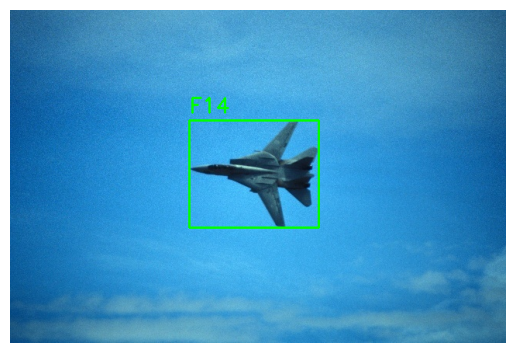

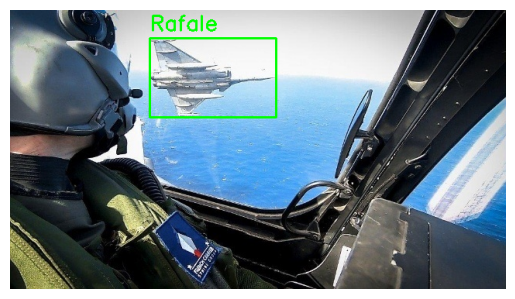

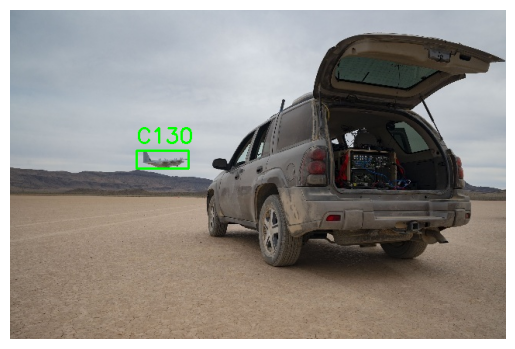

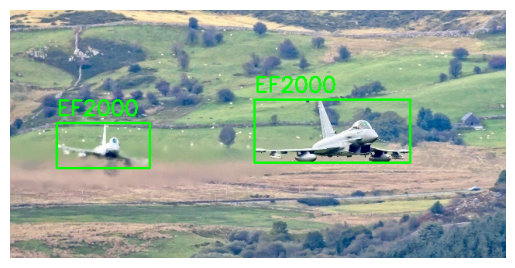

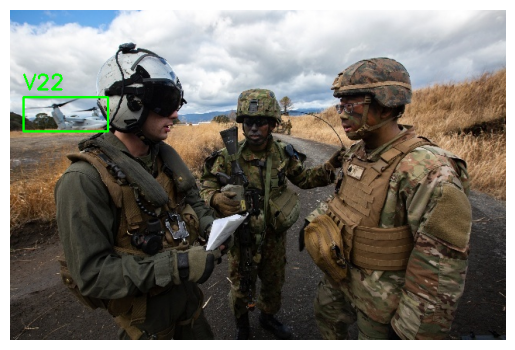

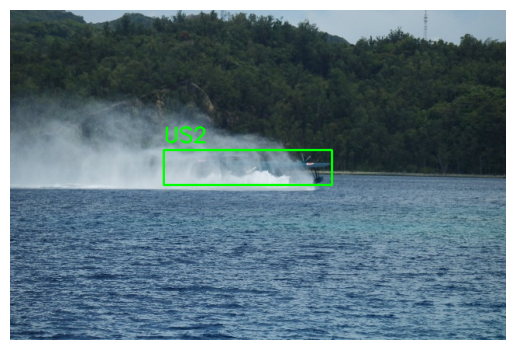

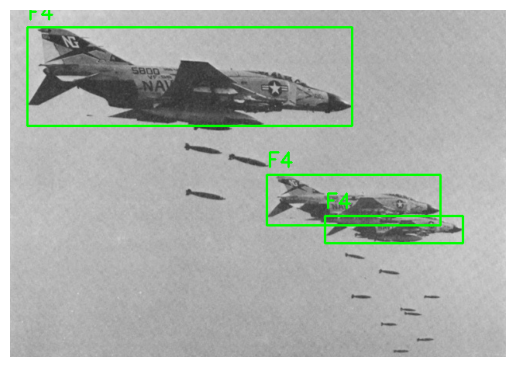

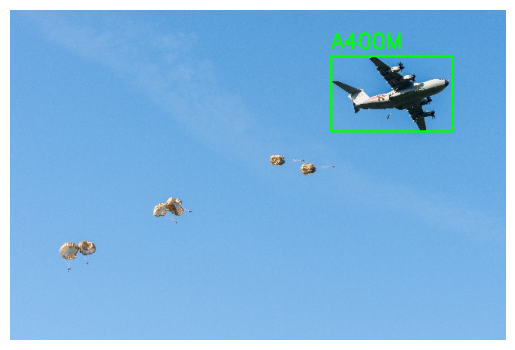

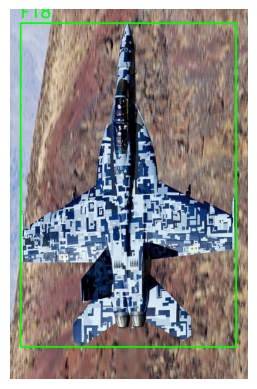

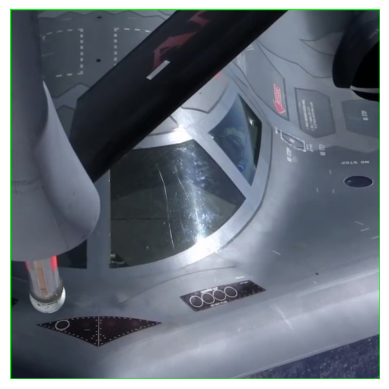

In [64]:
# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# We'll only take the first 5 image files
image_files = [file for file in files if file.endswith('.jpg')][:10]

# Iterate over each image file
for image_file in image_files:
    # Read the image
    img = cv2.imread(os.path.join(directory, image_file))
    h, w = img.shape[:2]

    # Resize the image
    if h > w:
        new_h, new_w = 640, int(640 * w / h)
    else:
        new_w, new_h = 640, int(640 * h / w)
    
    img_resized = cv2.resize(img, (new_w, new_h))

    # Read the xml file
    xml_file = image_file.replace('.jpg', '.xml')
    tree = ET.parse(os.path.join(directory, xml_file))
    root = tree.getroot()

    # Iterate over each object
    for obj in root.iter('object'):
        # Get the bounding box coordinates
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text) * new_w // w
        ymin = int(bbox.find('ymin').text) * new_h // h
        xmax = int(bbox.find('xmax').text) * new_w // w
        ymax = int(bbox.find('ymax').text) * new_h // h

        # Get the class name
        class_name = obj.find('name').text

        # Update the bounding box coordinates
        bbox.find('xmin').text = str(xmin)
        bbox.find('ymin').text = str(ymin)
        bbox.find('xmax').text = str(xmax)
        bbox.find('ymax').text = str(ymax)

        # Draw the bounding box on the image
        cv2.rectangle(img_resized, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(img_resized, class_name, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Plot the new image with bounding boxes for preview
    plt.figure()
    plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

### Add padding + edit .xml accordingly

1. Lets added the white padding to all of the images to make it 640 x 640 dpi
2. Edit the bbox coordinates in the .xml files according to the white padding added to every image with the corresponding names

In [67]:
import cv2
import os
import xml.etree.ElementTree as ET

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# We'll only process the first image file
image_file = next(file for file in files if file.endswith('.jpg'))

# Read the image file
img_path = os.path.join(directory, image_file)
img = cv2.imread(img_path)
height, width, _ = img.shape

# Create a white canvas of size 640x640
canvas = 255 * np.ones((640, 640, 3), dtype=np.uint8)

# Calculate the offset to center the image on the canvas
offset_x = int((640 - width) / 2)
offset_y = int((640 - height) / 2)

# Insert the image onto the canvas
canvas[offset_y:offset_y+height, offset_x:offset_x+width] = img

# Save the modified image
cv2.imwrite(img_path, canvas)
print(f"Modified {image_file} and added white padding.")

# Read the corresponding XML file
xml_file = image_file.replace('.jpg', '.xml')
xml_path = os.path.join(directory, xml_file)
tree = ET.parse(xml_path)
root = tree.getroot()

# Update the bounding box coordinates
for box in root.iter('bndbox'):
    xmin = int(box.find('xmin').text) + offset_x
    ymin = int(box.find('ymin').text) + offset_y
    xmax = int(box.find('xmax').text) + offset_x
    ymax = int(box.find('ymax').text) + offset_y

    box.find('xmin').text = str(xmin)
    box.find('ymin').text = str(ymin)
    box.find('xmax').text = str(xmax)
    box.find('ymax').text = str(ymax)

# Save the modified XML file
tree.write(xml_path)
print(f"Updated bounding boxes in {xml_file}.")

print("Processing of the first image is complete.")


Modified 4ae057a58917ed6cedccec8c50d8ed65.jpg and added white padding.
Updated bounding boxes in 4ae057a58917ed6cedccec8c50d8ed65.xml.
Processing of the first image is complete.


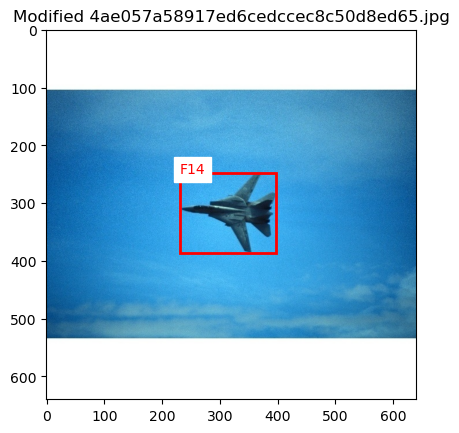

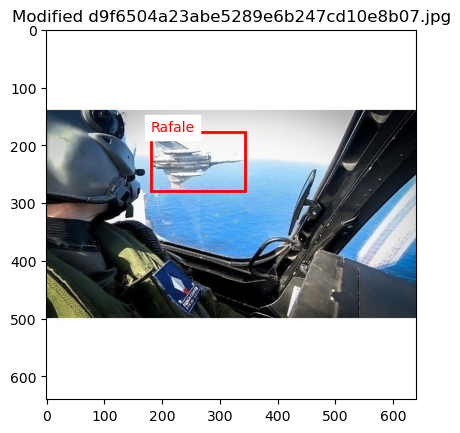

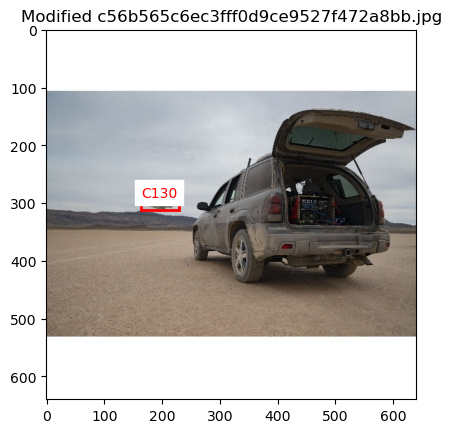

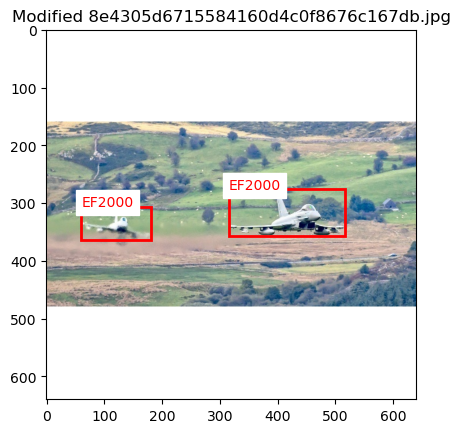

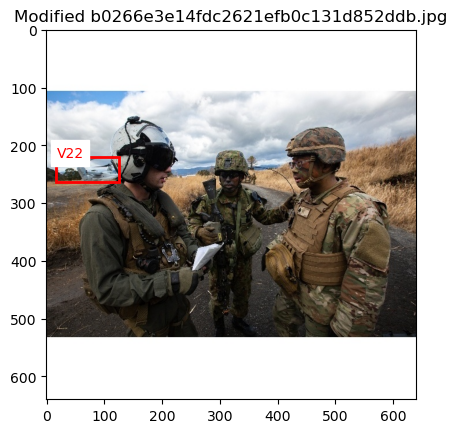

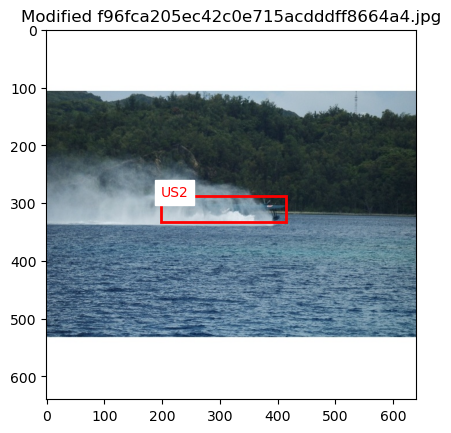

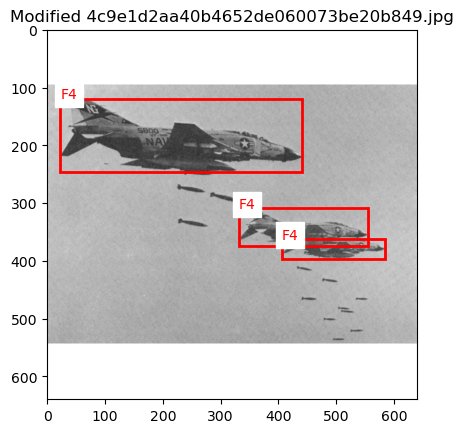

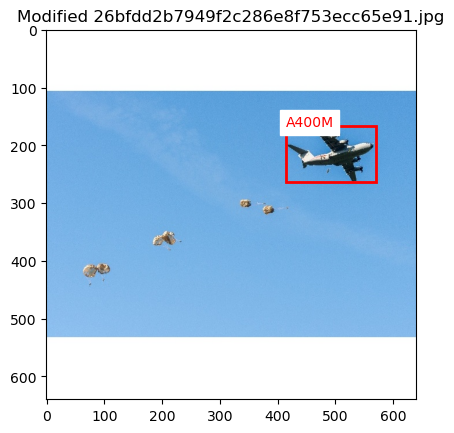

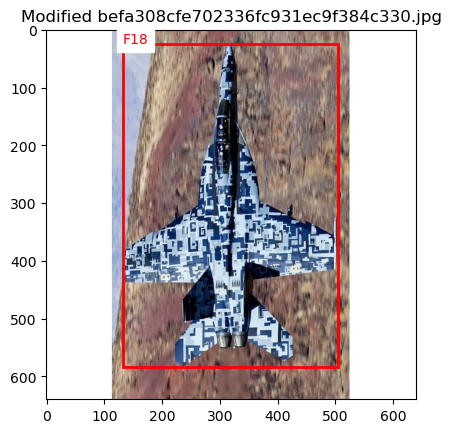

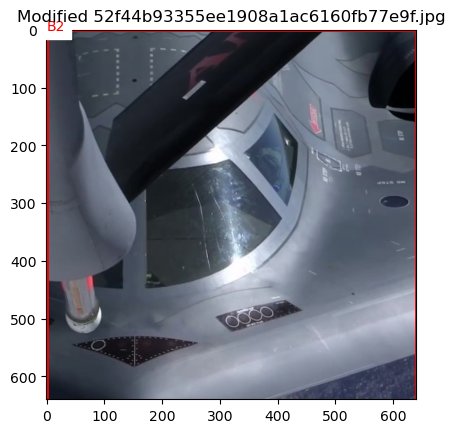

Processing of the first 2 images is complete.


In [76]:
import cv2
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import numpy as np

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# We'll only process the first 2 image files
image_files = [file for file in files if file.endswith('.jpg')][:10]

# Iterate over each image file
for image_file in image_files:
    # Read the image file
    img = cv2.imread(os.path.join(directory, image_file))

    # Create a white canvas of size 640x640
    canvas = 255 * np.ones((640, 640, 3), dtype=np.uint8)

    # Calculate the offset to center the image on the canvas
    offset_x = int((640 - img.shape[1]) / 2)
    offset_y = int((640 - img.shape[0]) / 2)

    # Insert the image onto the canvas
    canvas[offset_y:offset_y+img.shape[0], offset_x:offset_x+img.shape[1]] = img

    # Read the XML file
    xml_file = image_file.replace('.jpg', '.xml')
    tree = ET.parse(os.path.join(directory, xml_file))
    root = tree.getroot()

    # Update the bounding box coordinates and add labels
    for object_elem in root.findall('object'):
        bndbox_elem = object_elem.find('bndbox')
        xmin = int(bndbox_elem.find('xmin').text) + offset_x
        ymin = int(bndbox_elem.find('ymin').text) + offset_y
        xmax = int(bndbox_elem.find('xmax').text) + offset_x
        ymax = int(bndbox_elem.find('ymax').text) + offset_y

        bndbox_elem.find('xmin').text = str(xmin)
        bndbox_elem.find('ymin').text = str(ymin)
        bndbox_elem.find('xmax').text = str(xmax)
        bndbox_elem.find('ymax').text = str(ymax)

        name_elem = object_elem.find('name')
        label = name_elem.text
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor='r', facecolor='none'))
        plt.text(xmin, ymin, label, color='r', backgroundcolor='w')

    # Save the modified image
    cv2.imwrite(os.path.join(directory, image_file), canvas)

    # Plot the modified image with bounding boxes
    plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    plt.title(f"Modified {image_file}")
    plt.show()

    # Save the modified XML file
    tree.write(os.path.join(directory, xml_file))

print("Processing of the first 2 images is complete.")


FANTASTIC!! So now we need to do the same foe the rest of the .jpg and .xml files in the directory

In [75]:
import cv2
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import numpy as np

# Define the directory
directory = "/Users/peter/Desktop/images/"

# List all files in the directory
files = os.listdir(directory)

# Iterate over each file
for file in files:
    if file.endswith('.jpg'):
        # Read the image file
        img = cv2.imread(os.path.join(directory, file))

        # Create a white canvas of size 640x640
        canvas = 255 * np.ones((640, 640, 3), dtype=np.uint8)

        # Calculate the offset to center the image on the canvas
        offset_x = int((640 - img.shape[1]) / 2)
        offset_y = int((640 - img.shape[0]) / 2)

        # Insert the image onto the canvas
        canvas[offset_y:offset_y+img.shape[0], offset_x:offset_x+img.shape[1]] = img

        # Read the XML file
        xml_file = file.replace('.jpg', '.xml')
        tree = ET.parse(os.path.join(directory, xml_file))
        root = tree.getroot()

        # Update the bounding box coordinates and add labels
        for object_elem in root.findall('object'):
            bndbox_elem = object_elem.find('bndbox')
            xmin = int(bndbox_elem.find('xmin').text) + offset_x
            ymin = int(bndbox_elem.find('ymin').text) + offset_y
            xmax = int(bndbox_elem.find('xmax').text) + offset_x
            ymax = int(bndbox_elem.find('ymax').text) + offset_y

            bndbox_elem.find('xmin').text = str(xmin)
            bndbox_elem.find('ymin').text = str(ymin)
            bndbox_elem.find('xmax').text = str(xmax)
            bndbox_elem.find('ymax').text = str(ymax)

            name_elem = object_elem.find('name')
            label = name_elem.text
            plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=2, edgecolor='r', facecolor='none'))
            plt.text(xmin, ymin, label, color='r', backgroundcolor='w')

        # Save the modified image
        cv2.imwrite(os.path.join(directory, file), canvas)

        # Save the modified XML file
        tree.write(os.path.join(directory, xml_file))

print("Processing of all images is complete.")


Processing of all images is complete.


ValueError: Image size of 310565x224401 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 640x480 with 1 Axes>

Edit all of the <width> and <height> label in .xml format to 640 to 640 without changing the bbox coordinate

In [33]:
import os
import xml.etree.ElementTree as ET

def adjust_xml(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    size = root.find('size')
    size.find('width').text = '640'
    size.find('height').text = '640'

    tree.write(xml_path)

dir_path = "/Users/peter/Desktop/images/"

for file_name in os.listdir(dir_path):
    if file_name.endswith('.xml'):
        xml_path = os.path.join(dir_path, file_name)
        
        try:
            adjust_xml(xml_path)
        except:
            print(f"Unable to process {xml_path}")


In [34]:
# Count how many images in the directory
image_dir = "/Users/peter/Desktop/images"
jpg_count = 0

for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):
        jpg_count += 1

print(f"Number of .jpg files in the directory: {jpg_count}")


Number of .jpg files in the directory: 11585


In [35]:
# Lets get rid of the images that can not be resized
image_dir = "/Users/peter/Desktop/images"

for filename in os.listdir(image_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):  # checks for .jpg and .png files
        img_path = os.path.join(image_dir, filename)
        img = Image.open(img_path)

        # Check if the image size is not 640x640
        if img.size != (640, 640):
            print(f"Deleting {filename} and its corresponding XML file.")
            os.remove(img_path)  # Delete the image file

            # Try to delete the corresponding .xml file
            base_name = os.path.splitext(filename)[0]
            xml_file = os.path.join(image_dir, base_name + '.xml')
            if os.path.exists(xml_file):
                os.remove(xml_file)


Deleting 2790a93ba1210aaaa09931b951d2376a.jpg and its corresponding XML file.
Deleting f2ea4aad6f8980b2f9254cda9eb13e9b.jpg and its corresponding XML file.
Deleting e704da53011ed94a1644bec7ffc904e9.jpg and its corresponding XML file.
Deleting 7f35d5ac8df852e80c8a35c061ec9473.jpg and its corresponding XML file.
Deleting 7e722a1478e888c2d0b8bffeb7bbb154.jpg and its corresponding XML file.
Deleting 4075b1896e913e85d31001f6fbe2336e.jpg and its corresponding XML file.


In [36]:
# Count how many images in the directory
image_dir = "/Users/peter/Desktop/images"
jpg_count = 0

for filename in os.listdir(image_dir):
    if filename.endswith('.jpg'):
        jpg_count += 1

print(f"Number of .jpg files in the directory: {jpg_count}")


Number of .jpg files in the directory: 11579


### Let's see the new resized image + new boudning boxes

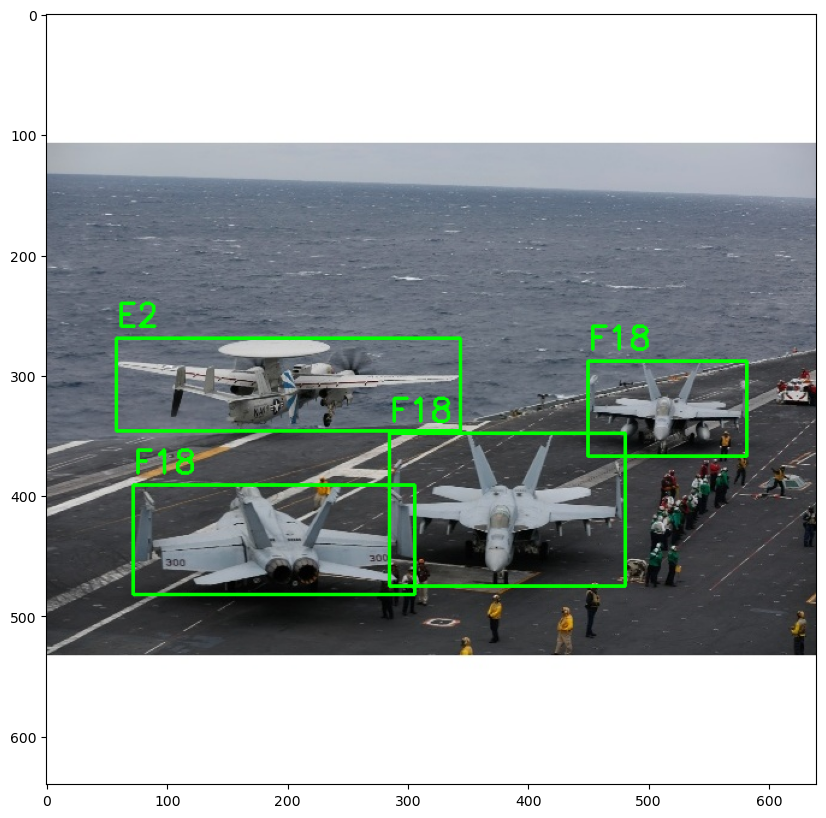

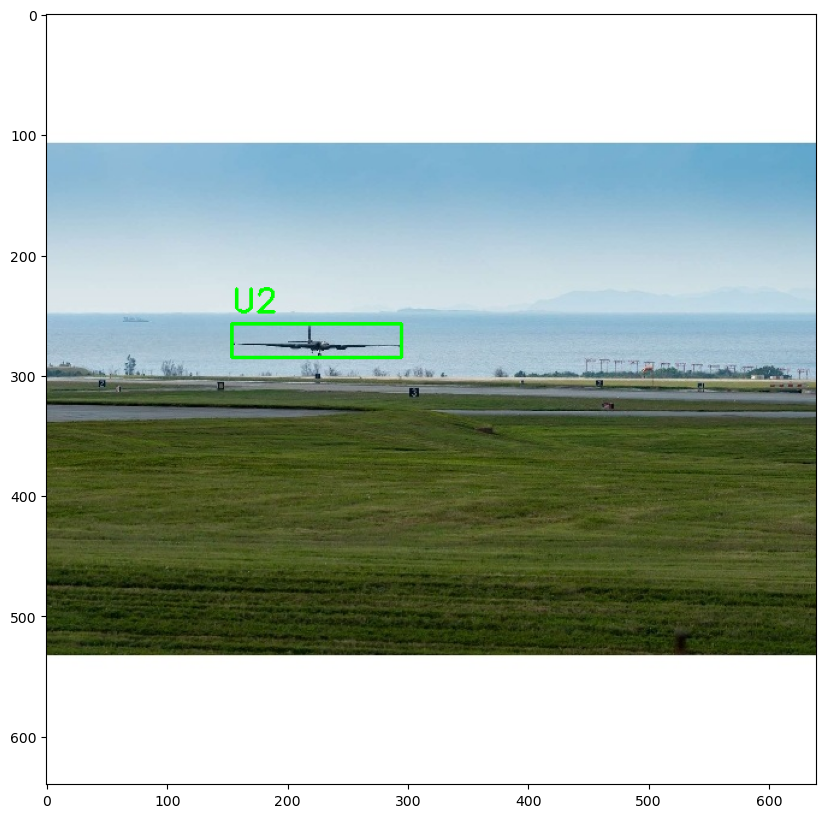

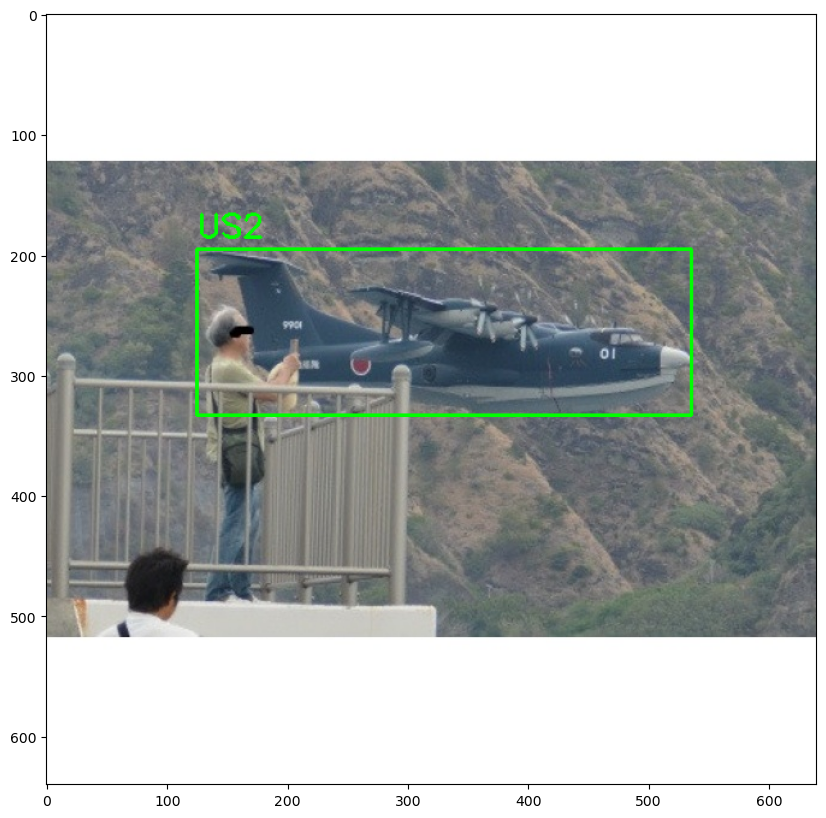

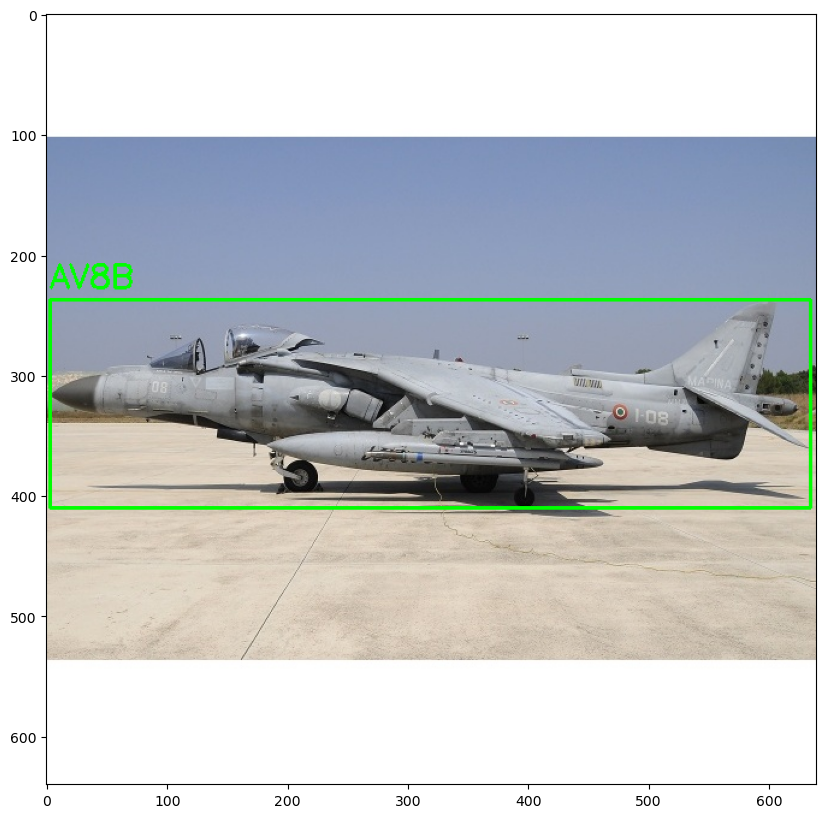

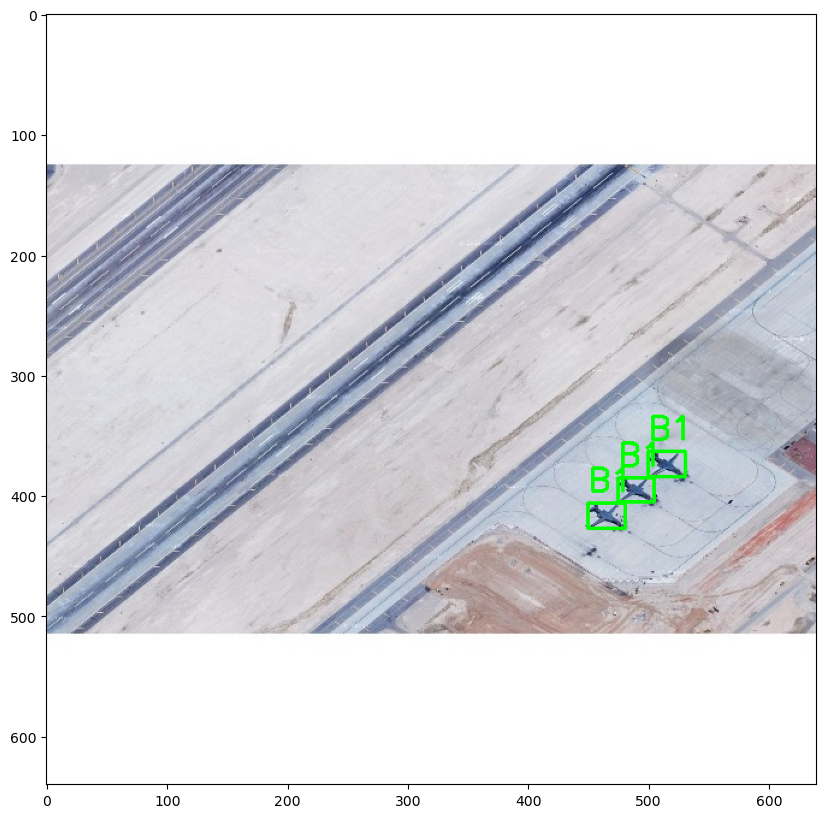

In [78]:
import cv2
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt

def draw_bboxes_on_image(image_path, xml_path):
    image = cv2.imread(image_path)
    tree = ET.parse(xml_path)
    root = tree.getroot()
    
    for object in root.findall('object'):
        bndbox = object.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        class_name = object.find('name').text
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(image, class_name, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
    
    return image

dir_path = "/Users/peter/Desktop/images/"
xml_files = [file for file in os.listdir(dir_path) if file.endswith('.xml')]
xml_files = xml_files[:5]  # Select the first 5 files

for xml_file in xml_files:
    image_file = xml_file.replace('.xml', '.jpg')  # Assuming images are in .jpg format
    image_path = os.path.join(dir_path, image_file)
    xml_path = os.path.join(dir_path, xml_file)

    image_with_bboxes = draw_bboxes_on_image(image_path, xml_path)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image_with_bboxes, cv2.COLOR_BGR2RGB))
    plt.show()


Before we zip for CoLab training, make sure all images are in the right size